# Import Library: 분석에 사용할 모듈 설치
**1. Import Library**

In [1]:
!python -m pip install --user --upgrade pip

Requirement already up-to-date: pip in c:\users\kk\appdata\roaming\python\python38\site-packages (20.2.3)


In [2]:
!pip3 install lightgbm xgboost

     |████████████████████████████████| 1.2 MB 653 kB/s            


In [97]:
# Ignore the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Data manipulation, visualization and useful functions
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_rows = 50
pd.options.display.max_columns = 40
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

# Modeling algorithms
# General(Statistics/Econometrics)
from sklearn import preprocessing
import statsmodels.api as sm
import statsmodels.tsa.api as smt
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy import stats

# Regression
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, GradientBoostingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

# Classification
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

# Model selection
from sklearn.model_selection import train_test_split,cross_validate
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

# Evaluation metrics
# for regression
from sklearn.metrics import mean_squared_log_error, mean_squared_error,  r2_score, mean_absolute_error
# for classification
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [98]:
### Feature engineering of default
def non_feature_engineering(raw):
    if 'datetime' in raw.columns:
        raw['datetime'] = pd.to_datetime(raw['datetime'])
        raw['DateTime'] = pd.to_datetime(raw['datetime'])
    if raw.index.dtype == 'int64':
        raw.set_index('DateTime', inplace=True)
    # bring back
    # if raw.index.dtype != 'int64':
    #     raw.reset_index(drop=False, inplace=True)
    raw = raw.asfreq('H', method='ffill')
    raw_nfe = raw.copy()
    return raw_nfe
# raw_rd = non_feature_engineering(raw_all)


### Feature engineering of all
def feature_engineering(raw):
    if 'datetime' in raw.columns:
        raw['datetime'] = pd.to_datetime(raw['datetime'])
        raw['DateTime'] = pd.to_datetime(raw['datetime'])

    if raw.index.dtype == 'int64':
        raw.set_index('DateTime', inplace=True)

    raw = raw.asfreq('H', method='ffill')

    result = sm.tsa.seasonal_decompose(raw['count'], model='additive')
    Y_trend = pd.DataFrame(result.trend)
    Y_trend.fillna(method='ffill', inplace=True)
    Y_trend.fillna(method='bfill', inplace=True)
    Y_trend.columns = ['count_trend']
    Y_seasonal = pd.DataFrame(result.seasonal)
    Y_seasonal.fillna(method='ffill', inplace=True)
    Y_seasonal.fillna(method='bfill', inplace=True)
    Y_seasonal.columns = ['count_seasonal']
    pd.concat([raw, Y_trend, Y_seasonal], axis=1).isnull().sum()
    if 'count_trend' not in raw.columns:
        if 'count_seasonal' not in raw.columns:
            raw = pd.concat([raw, Y_trend, Y_seasonal], axis=1)

    Y_count_Day = raw[['count']].rolling(24).mean()
    Y_count_Day.fillna(method='ffill', inplace=True)
    Y_count_Day.fillna(method='bfill', inplace=True)
    Y_count_Day.columns = ['count_Day']
    Y_count_Week = raw[['count']].rolling(24*7).mean()
    Y_count_Week.fillna(method='ffill', inplace=True)
    Y_count_Week.fillna(method='bfill', inplace=True)
    Y_count_Week.columns = ['count_Week']
    if 'count_Day' not in raw.columns:
        raw = pd.concat([raw, Y_count_Day], axis=1)
    if 'count_Week' not in raw.columns:
        raw = pd.concat([raw, Y_count_Week], axis=1)

    Y_diff = raw[['count']].diff()
    Y_diff.fillna(method='ffill', inplace=True)
    Y_diff.fillna(method='bfill', inplace=True)
    Y_diff.columns = ['count_diff']
    if 'count_diff' not in raw.columns:
        raw = pd.concat([raw, Y_diff], axis=1)

    raw['temp_group'] = pd.cut(raw['temp'], 10)
    raw['Year'] = raw.datetime.dt.year
    raw['Quater'] = raw.datetime.dt.quarter
    raw['Quater_ver2'] = raw['Quater'] + (raw.Year - raw.Year.min()) * 4
    raw['Month'] = raw.datetime.dt.month
    raw['Day'] = raw.datetime.dt.day
    raw['Hour'] = raw.datetime.dt.hour
    raw['DayofWeek'] = raw.datetime.dt.dayofweek

    raw['count_lag1'] = raw['count'].shift(1)
    raw['count_lag2'] = raw['count'].shift(2)
    raw['count_lag1'].fillna(method='bfill', inplace=True)
    raw['count_lag2'].fillna(method='bfill', inplace=True)

    if 'Quater' in raw.columns:
        if 'Quater_Dummy' not in ['_'.join(col.split('_')[:2]) for col in raw.columns]:
            raw = pd.concat([raw, pd.get_dummies(raw['Quater'], 
                                                 prefix='Quater_Dummy', drop_first=True)], axis=1)
            del raw['Quater']
    raw_fe = raw.copy()
    return raw_fe
# raw_fe = feature_engineering(raw_all)


### Data split of cross sectional
def datasplit_cs(raw, Y_colname, X_colname, test_size, random_seed=123):
    X_train, X_test, Y_train, Y_test = train_test_split(raw[X_colname], raw[Y_colname], test_size=test_size, random_state=random_seed)
    print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
    print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)
    return X_train, X_test, Y_train, Y_test
# X_train, X_test, Y_train, Y_test = datasplit_cs(raw_fe, Y_colname, X_colname, 0.2)


### Data split of time series
def datasplit_ts(raw, Y_colname, X_colname, criteria):
    raw_train = raw.loc[raw.index < criteria,:]
    raw_test = raw.loc[raw.index >= criteria,:]
    Y_train = raw_train[Y_colname]
    X_train = raw_train[X_colname]
    Y_test = raw_test[Y_colname]
    X_test = raw_test[X_colname]
    print('Train_size:', raw_train.shape, 'Test_size:', raw_test.shape)
    print('X_train:', X_train.shape, 'Y_train:', Y_train.shape)
    print('X_test:', X_test.shape, 'Y_test:', Y_test.shape)
    return X_train, X_test, Y_train, Y_test
# X_train, X_test, Y_train, Y_test = datasplit_ts(raw_fe, Y_colname, X_colname, '2012-07-01')


### Evaluation of 1 pair of set
def evaluation(Y_real, Y_pred, graph_on=False):
    loss_length = len(Y_real.values.flatten()) - len(Y_pred)
    if loss_length != 0:
        Y_real = Y_real[loss_length:]
    if graph_on == True:
        pd.concat([Y_real, pd.DataFrame(Y_pred, index=Y_real.index, columns=['prediction'])], axis=1).plot(kind='line', figsize=(20,6),
                                                                                                           xlim=(Y_real.index.min(),Y_real.index.max()),
                                                                                                           linewidth=3, fontsize=20)
        plt.title('Time Series of Target', fontsize=20)
        plt.xlabel('Index', fontsize=15)
        plt.ylabel('Target Value', fontsize=15)
    MAE = abs(Y_real.values.flatten() - Y_pred).mean()
    MSE = ((Y_real.values.flatten() - Y_pred)**2).mean()
    MAPE = (abs(Y_real.values.flatten() - Y_pred)/Y_real.values.flatten()*100).mean()
    Score = pd.DataFrame([MAE, MSE, MAPE], index=['MAE', 'MSE', 'MAPE'], columns=['Score']).T
    Residual = pd.DataFrame(Y_real.values.flatten() - Y_pred, index=Y_real.index, columns=['Error'])
    return Score, Residual
# Score_tr, Residual_tr = evaluation(Y_train, pred_tr_reg1, graph_on=True)


### Evaluation of train/test pairs
def evaluation_trte(Y_real_tr, Y_pred_tr, Y_real_te, Y_pred_te, graph_on=False):
    Score_tr, Residual_tr = evaluation(Y_real_tr, Y_pred_tr, graph_on=graph_on)
    Score_te, Residual_te = evaluation(Y_real_te, Y_pred_te, graph_on=graph_on)
    Score_trte = pd.concat([Score_tr, Score_te], axis=0)
    Score_trte.index = ['Train', 'Test']
    return Score_trte, Residual_tr, Residual_te
# Score_reg1, Resid_tr_reg1, Resid_te_reg1 = evaluation_trte(Y_train, pred_tr_reg1, Y_test, pred_te_reg1, graph_on=True)


### Error analysis
def stationarity_adf_test(Y_Data, Target_name):
    if len(Target_name) == 0:
        Stationarity_adf = pd.Series(sm.tsa.stattools.adfuller(Y_Data)[0:4],
                                     index=['Test Statistics', 'p-value', 'Used Lag', 'Used Observations'])
        for key, value in sm.tsa.stattools.adfuller(Y_Data)[4].items():
            Stationarity_adf['Critical Value(%s)'%key] = value
            Stationarity_adf['Maximum Information Criteria'] = sm.tsa.stattools.adfuller(Y_Data)[5]
            Stationarity_adf = pd.DataFrame(Stationarity_adf, columns=['Stationarity_adf'])
    else:
        Stationarity_adf = pd.Series(sm.tsa.stattools.adfuller(Y_Data[Target_name])[0:4],
                                     index=['Test Statistics', 'p-value', 'Used Lag', 'Used Observations'])
        for key, value in sm.tsa.stattools.adfuller(Y_Data[Target_name])[4].items():
            Stationarity_adf['Critical Value(%s)'%key] = value
            Stationarity_adf['Maximum Information Criteria'] = sm.tsa.stattools.adfuller(Y_Data[Target_name])[5]
            Stationarity_adf = pd.DataFrame(Stationarity_adf, columns=['Stationarity_adf'])
    return Stationarity_adf

def stationarity_kpss_test(Y_Data, Target_name):
    if len(Target_name) == 0:
        Stationarity_kpss = pd.Series(sm.tsa.stattools.kpss(Y_Data)[0:3],
                                      index=['Test Statistics', 'p-value', 'Used Lag'])
        for key, value in sm.tsa.stattools.kpss(Y_Data)[3].items():
            Stationarity_kpss['Critical Value(%s)'%key] = value
            Stationarity_kpss = pd.DataFrame(Stationarity_kpss, columns=['Stationarity_kpss'])
    else:
        Stationarity_kpss = pd.Series(sm.tsa.stattools.kpss(Y_Data[Target_name])[0:3],
                                      index=['Test Statistics', 'p-value', 'Used Lag'])
        for key, value in sm.tsa.stattools.kpss(Y_Data[Target_name])[3].items():
            Stationarity_kpss['Critical Value(%s)'%key] = value
            Stationarity_kpss = pd.DataFrame(Stationarity_kpss, columns=['Stationarity_kpss'])
    return Stationarity_kpss

def error_analysis(Y_Data, Target_name, X_Data, graph_on=False):
    for x in Target_name:
        Target_name = x
    X_Data = X_Data.loc[Y_Data.index]

    if graph_on == True:
        ##### Error Analysis(Plot)
        Y_Data['RowNum'] = Y_Data.reset_index().index

        # Stationarity(Trend) Analysis
        sns.set(palette="muted", color_codes=True, font_scale=2)
        sns.lmplot(x='RowNum', y=Target_name, data=Y_Data, fit_reg='True', size=5.2, aspect=2, ci=99, sharey=True)
        del Y_Data['RowNum']

        # Normal Distribution Analysis
        figure, axes = plt.subplots(figsize=(12,8))
        sns.distplot(Y_Data[Target_name], norm_hist='True', fit=stats.norm, ax=axes)

        # Lag Analysis
        length = int(len(Y_Data[Target_name])/10)
        figure, axes = plt.subplots(1, 4, figsize=(12,3))
        pd.plotting.lag_plot(Y_Data[Target_name], lag=1, ax=axes[0])
        pd.plotting.lag_plot(Y_Data[Target_name], lag=5, ax=axes[1])
        pd.plotting.lag_plot(Y_Data[Target_name], lag=10, ax=axes[2])
        pd.plotting.lag_plot(Y_Data[Target_name], lag=50, ax=axes[3])

        
        
        # Autocorrelation Analysis
        figure, axes = plt.subplots(2,1,figsize=(12,5))
        sm.tsa.graphics.plot_acf(Y_Data[Target_name], lags=100, use_vlines=True, ax=axes[0])
        sm.tsa.graphics.plot_pacf(Y_Data[Target_name], lags=100, use_vlines=True, ax=axes[1])

    ##### Error Analysis(Statistics)
    # Checking Stationarity
    # Null Hypothesis: The Time-series is non-stationalry
    Stationarity_adf = stationarity_adf_test(Y_Data, Target_name)
    Stationarity_kpss = stationarity_kpss_test(Y_Data, Target_name)

    # Checking of Normality
    # Null Hypothesis: The residuals are normally distributed
    Normality = pd.DataFrame([stats.shapiro(Y_Data[Target_name])],
                             index=['Normality'], columns=['Test Statistics', 'p-value']).T

    # Checking for Autocorrelation
    # Null Hypothesis: Autocorrelation is absent
#     Autocorrelation = pd.concat([pd.DataFrame(sm.stats.diagnostic.acorr_ljungbox(Y_Data[Target_name], lags=[1,5,10,50])[0], columns=['Test Statistics']),
#                                  pd.DataFrame(sm.stats.diagnostic.acorr_ljungbox(Y_Data[Target_name], lags=[1,5,10,50])[1], columns=['p-value'])], axis=1).T
#     Autocorrelation.columns = ['Autocorr(lag1)', 'Autocorr(lag5)', 'Autocorr(lag10)', 'Autocorr(lag50)']


    Autocorrelation = sm.stats.diagnostic.acorr_ljungbox(Y_Data[Target_name], lags=[1,5,10,50])
    Autocorrelation = Autocorrelation.T
    Autocorrelation.columns = ['Autocorr(lag1)', 'Autocorr(lag5)', 'Autocorr(lag10)', 'Autocorr(lag50)']
    Autocorrelation = Autocorrelation.rename(index = {'lb_stat':'Test Statistics', 'lb_pvalue':'p-value'})
    
    # Checking Heteroscedasticity
    # Null Hypothesis: Error terms are homoscedastic
    Heteroscedasticity = pd.DataFrame([sm.stats.diagnostic.het_goldfeldquandt(Y_Data[Target_name], X_Data.values, alternative='two-sided')],
                                      index=['Heteroscedasticity'], columns=['Test Statistics', 'p-value', 'Alternative']).T
    Score = pd.concat([Stationarity_adf, Stationarity_kpss, Normality, Autocorrelation, Heteroscedasticity], join='outer', axis=1)
    index_new = ['Test Statistics', 'p-value', 'Alternative', 'Used Lag', 'Used Observations',
                 'Critical Value(1%)', 'Critical Value(5%)', 'Critical Value(10%)', 'Maximum Information Criteria']
    Score.reindex(index_new)
    return Score
# error_analysis(Resid_tr_reg1[1:], ['Error'], X_train, graph_on=True)

# Base분석 결과확인

## Code Summary (Raw Data)

Train_size: (13128, 12) Test_size: (4416, 12)
X_train: (13128, 8) Y_train: (13128, 1)
X_test: (4416, 8) Y_test: (4416, 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  count   R-squared (uncentered):                   0.638
Model:                            OLS   Adj. R-squared (uncentered):              0.638
Method:                 Least Squares   F-statistic:                              2889.
Date:                Sun, 21 Nov 2021   Prob (F-statistic):                        0.00
Time:                        01:00:01   Log-Likelihood:                         -83421.
No. Observations:               13128   AIC:                                  1.669e+05
Df Residuals:                   13120   BIC:                                  1.669e+05
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
season         3.3659      1.286      2.618      0.009       0.846       5.886
holiday       -6.2896      7.466     -0.842      0.400     -20.924       8.345
workingday    10.3553      2.641      3.921      0.000       5.178      15.533
weather        7.1906      2.093      3.436      0.001       3.089      11.292
temp          -7.8544      1.222     -6.429      0.000     -10.249      -5.460
atemp         16.0695      1.095     14.676      0.000      13.923      18.216
humidity      -1.7353      0.063    -27.356      0.000      -1.860      -1.611
windspeed      2.2749      0.136     16.745      0.000       2.009       2.541
==============================================================================
Omnibus:                     2168.771   Durbin-Watson:                   0.419
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3942.747
Skew:                           1.050   Prob(JB):                         0.00
Kurtosis:                       4.672   Cond. No.                         450.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

,MAE,MSE,MAPE
Train,103.09,"19,360.42",458.48
Test,150.03,"43,410.27",316.61


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-9.25,19.30,0.94,"8,204.84","12,494.43","13,138.03","48,485.56",1.76
p-value,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00
Used Lag,40.00,18.00,NaN,NaN,NaN,NaN,NaN,NaN
Used Observations,"13,087.00",NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(1%),-3.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Maximum Information Criteria,"143,252.82",NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(10%),NaN,0.35,NaN,NaN,NaN,NaN,NaN,NaN
Alternative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,two-sided


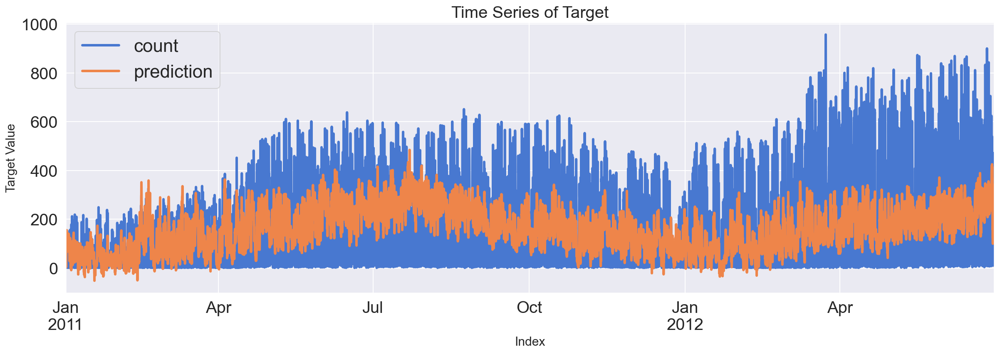

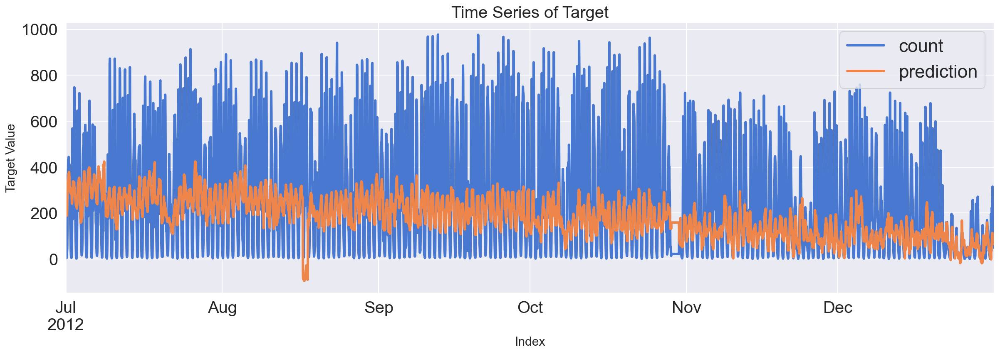

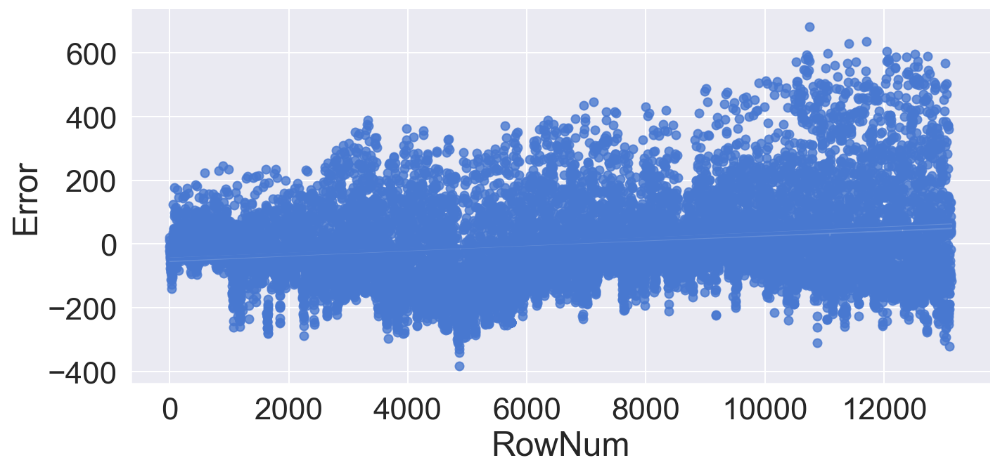

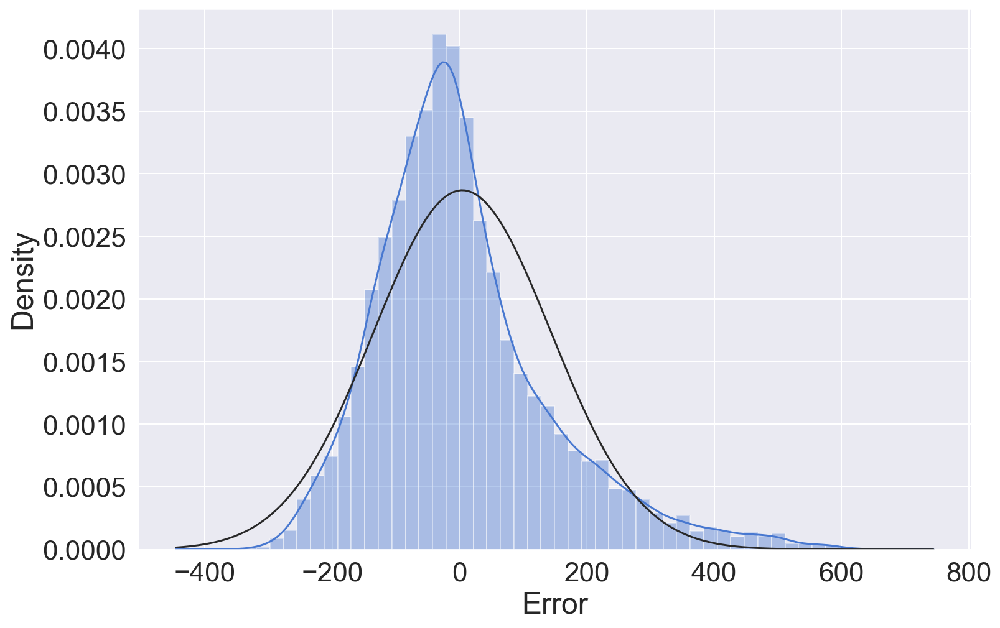

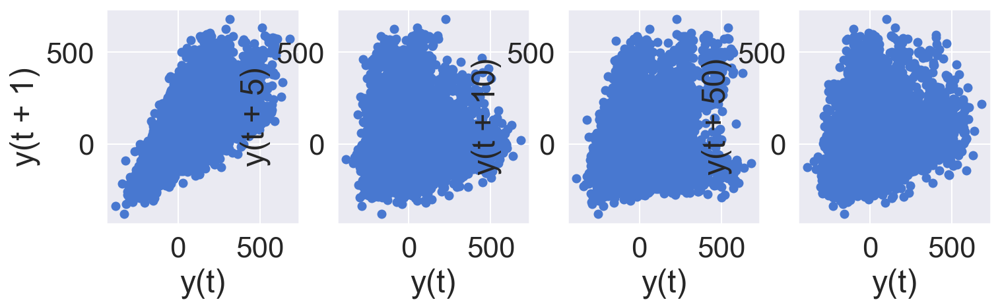

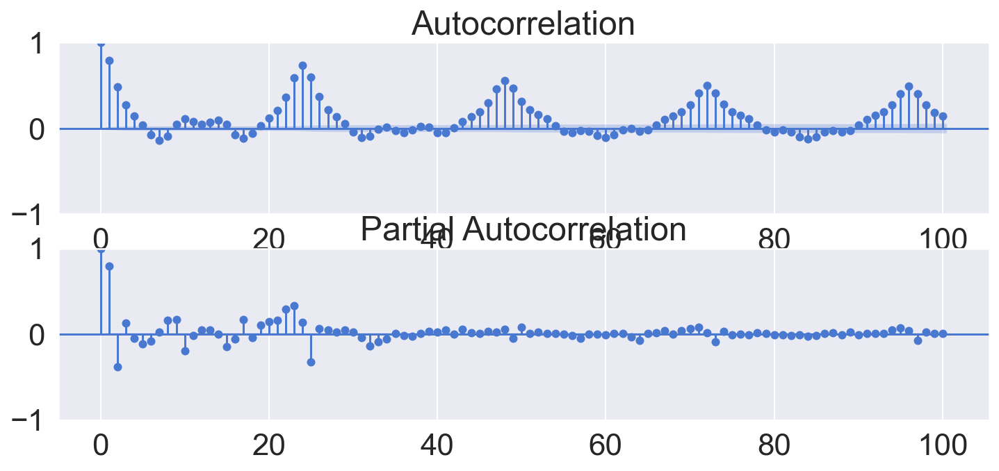

In [22]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './lecture_source/OnlineTSA-master/Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_rd = non_feature_engineering(raw_all)

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_rd.columns if x not in Y_colname+X_remove]
X_train_rd, X_test_rd, Y_train_rd, Y_test_rd = datasplit_ts(raw_rd, Y_colname, X_colname, '2012-07-01')

# Applying Base Model
fit_reg1_rd = sm.OLS(Y_train_rd, X_train_rd).fit()
display(fit_reg1_rd.summary())
pred_tr_reg1_rd = fit_reg1_rd.predict(X_train_rd).values
pred_te_reg1_rd = fit_reg1_rd.predict(X_test_rd).values

# Evaluation
Score_reg1_rd, Resid_tr_reg1_rd, Resid_te_reg1_rd = evaluation_trte(Y_train_rd, pred_tr_reg1_rd, 
                                                                Y_test_rd, pred_te_reg1_rd, graph_on=True)
display(Score_reg1_rd)

# Error Analysis
error_analysis(Resid_tr_reg1_rd, ['Error'], X_train_rd, graph_on=True)

## Code Summary (Feature Engineering Data)

Train_size: (13128, 29) Test_size: (4416, 29)
X_train: (13128, 24) Y_train: (13128, 1)
X_test: (4416, 24) Y_test: (4416, 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  count   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.362e+08
Date:                Sun, 21 Nov 2021   Prob (F-statistic):               0.00
Time:                        01:00:10   Log-Likelihood:                 1906.2
No. Observations:               13128   AIC:                            -3764.
Df Residuals:                   13104   BIC:                            -3585.
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
season            -0.0005      0.004     -0.129      0.897      -0.009       0.008
holiday            0.0083      0.014      0.612      0.540      -0.018       0.035
workingday         0.0079      0.007      1.184      0.236      -0.005       0.021
weather            0.0042      0.003      1.232      0.218      -0.003       0.011
temp               0.0022      0.002      1.075      0.282      -0.002       0.006
atemp             -0.0025      0.002     -1.347      0.178      -0.006       0.001
humidity          -0.0001      0.000     -0.845      0.398      -0.000       0.000
windspeed          0.0003      0.000      1.062      0.288      -0.000       0.001
count_trend     9.161e-05   8.57e-05      1.069      0.285   -7.64e-05       0.000
count_seasonal  1.984e-05   2.56e-05      0.775      0.438   -3.03e-05       7e-05
count_Day       4.177e-05   8.36e-05      0.500      0.617      -0.000       0.000
count_Week     -4.345e-05   9.61e-05     -0.452      0.651      -0.000       0.000
count_diff         1.0000    2.9e-05   3.45e+04      0.000       1.000       1.000
Year           -1.547e-05   7.97e-06     -1.939      0.052   -3.11e-05    1.66e-07
Quater_ver2        0.0004      0.002      0.180      0.857      -0.004       0.005
Month              0.0026      0.002      1.051      0.293      -0.002       0.007
Day                0.0004      0.000      1.728      0.084   -4.91e-05       0.001
Hour               0.0006      0.000      1.538      0.124      -0.000       0.001
DayofWeek          0.0003      0.002      0.224      0.823      -0.003       0.003
count_lag1         1.0000    2.7e-05    3.7e+04      0.000       1.000       1.000
count_lag2     -1.926e-05   2.59e-05     -0.744      0.457      -7e-05    3.15e-05
Quater_Dummy_2    -0.0010      0.009     -0.115      0.909      -0.019       0.017
Quater_Dummy_3    -0.0037      0.017     -0.220      0.826      -0.037       0.030
Quater_Dummy_4    -0.0132      0.026     -0.512      0.609      -0.064       0.037
==============================================================================
Omnibus:                    54426.083   Durbin-Watson:                   1.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):      93552024983.822
Skew:                        -114.255   Prob(JB):                         0.00
Kurtosis:                   13078.751   Cond. No.                     3.49e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.49e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

,MAE,MSE,MAPE
Train,0.01,0.04,0.06
Test,0.01,0.00,0.03


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-9.98,0.09,0.01,0.00,0.01,0.03,0.10,0.00
p-value,0.00,0.10,0.00,0.98,1.00,1.00,1.00,0.00
Used Lag,41.00,2.00,NaN,NaN,NaN,NaN,NaN,NaN
Used Observations,"13,086.00",NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(1%),-3.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Maximum Information Criteria,"-106,845.57",NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(10%),NaN,0.35,NaN,NaN,NaN,NaN,NaN,NaN
Alternative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,two-sided


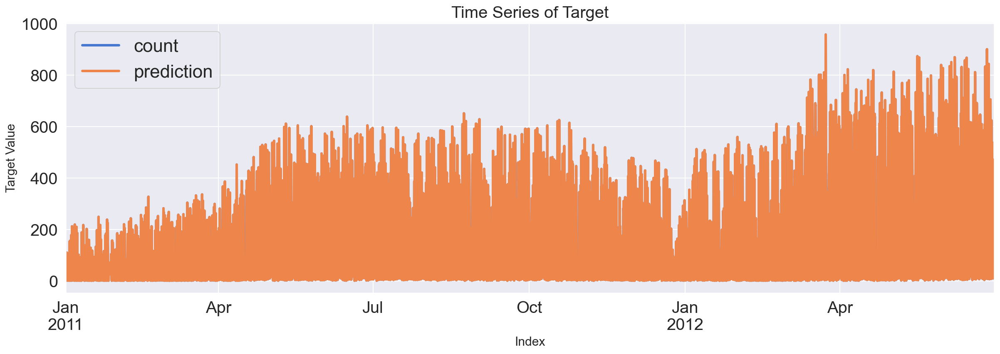

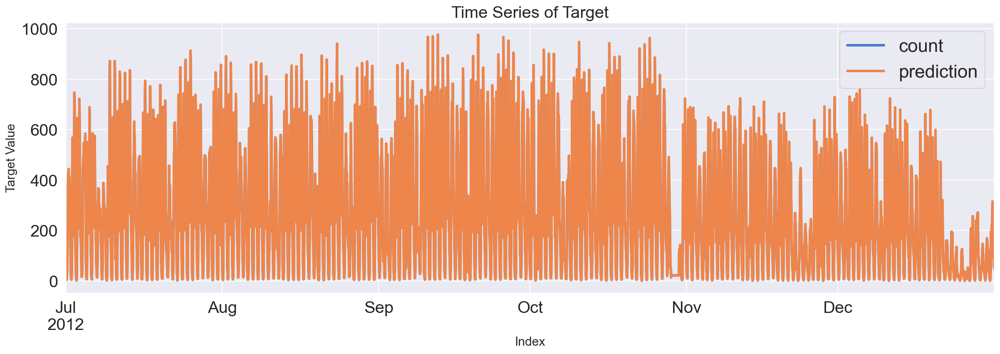

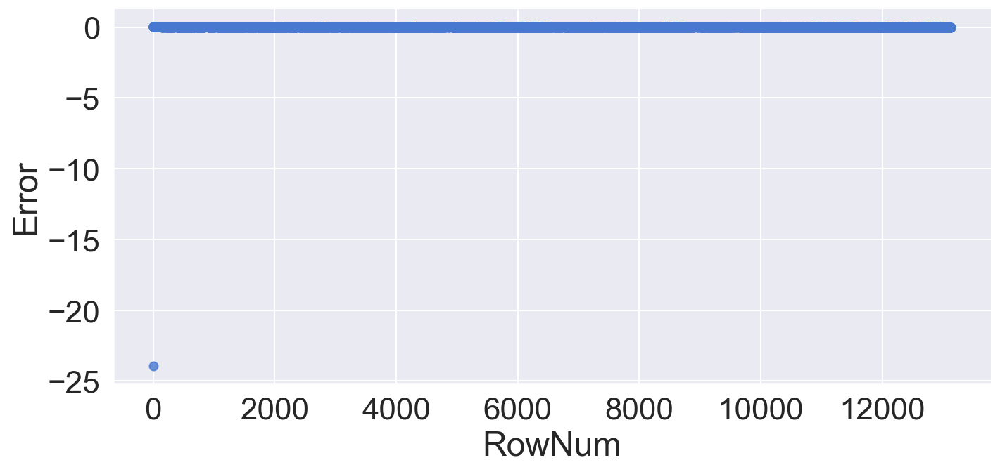

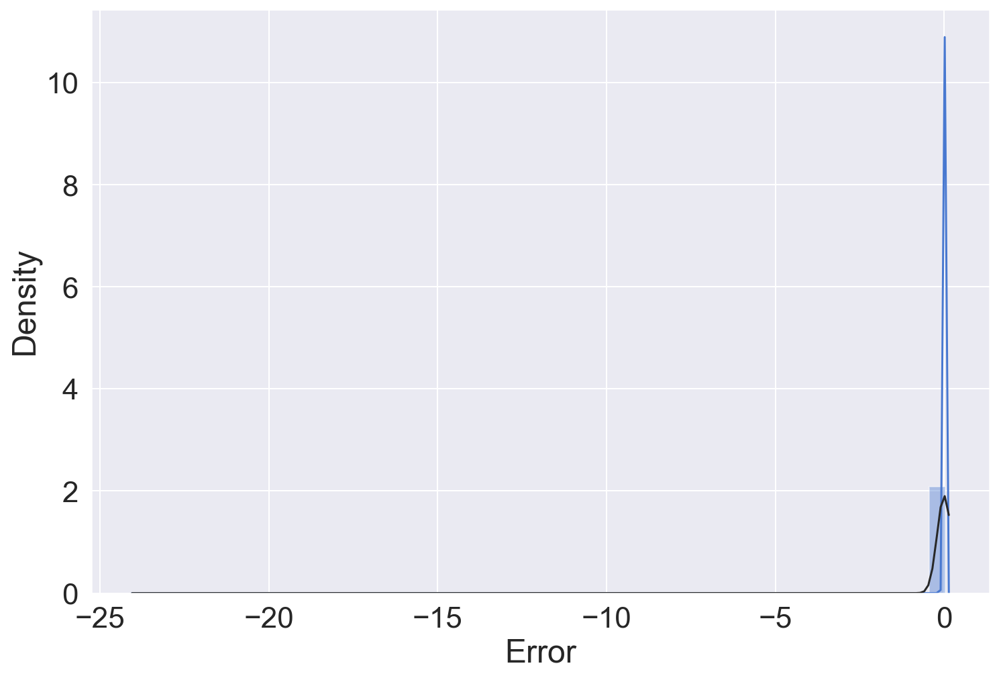

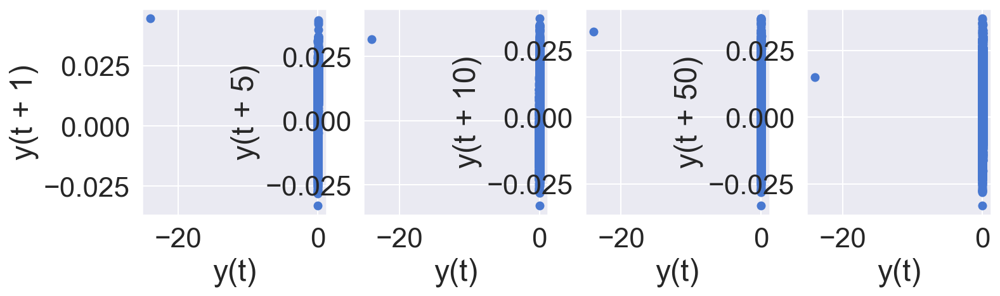

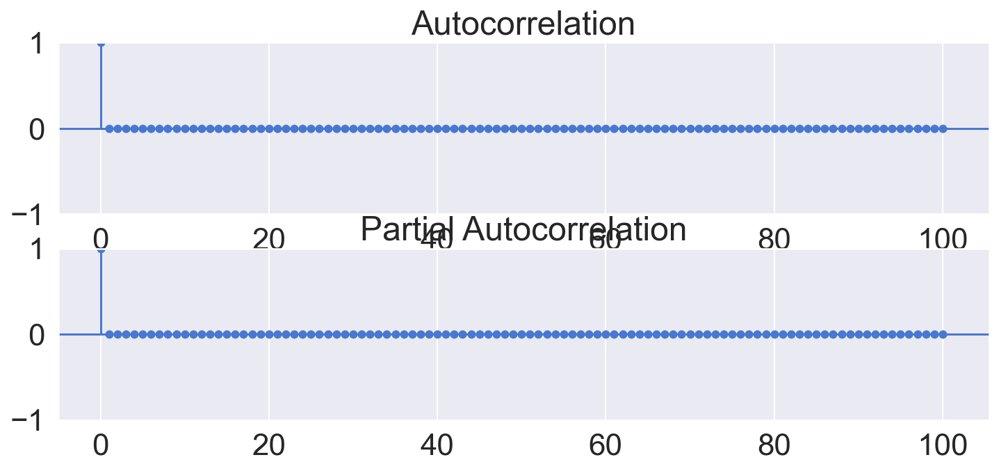

In [23]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './lecture_source/OnlineTSA-master/Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_fe = feature_engineering(raw_all)

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train_fe, X_test_fe, Y_train_fe, Y_test_fe = datasplit_ts(raw_fe, Y_colname, X_colname, '2012-07-01')

# Applying Base Model
fit_reg1_fe = sm.OLS(Y_train_fe, X_train_fe).fit()
display(fit_reg1_fe.summary())
pred_tr_reg1_fe = fit_reg1_fe.predict(X_train_fe).values
pred_te_reg1_fe = fit_reg1_fe.predict(X_test_fe).values

# Evaluation
Score_reg1_fe, Resid_tr_reg1_fe, Resid_te_reg1_fe = evaluation_trte(Y_train_fe, pred_tr_reg1_fe,
                                                                Y_test_fe, pred_te_reg1_fe, graph_on=True)
display(Score_reg1_fe)

# Error Analysis
error_analysis(Resid_tr_reg1_fe, ['Error'], X_train_fe, graph_on=True)

In [14]:
display(Score_reg1_rd)
display(Score_reg1_fe)

,MAE,MSE,MAPE
Train,103.09,"19,360.42",458.48
Test,150.03,"43,410.27",316.61


,MAE,MSE,MAPE
Train,0.01,0.04,0.06
Test,0.01,0.00,0.03


이게 overfitting 된 것이라는 것. 

# Feature Engineering: 시간현실반영 / 변수간스케일조정 / 다중공선성제거

## 시간현실반영

In [15]:
raw_fe.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,count_trend,count_seasonal,count_Day,count_Week,count_diff,temp_group,Year,Quater_ver2,Month,Day,Hour,DayofWeek,count_lag1,count_lag2,Quater_Dummy_2,Quater_Dummy_3,Quater_Dummy_4
DateTime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1,0,0,1,9.84,14.39,81,0.00,3,13,16,41.06,-134.25,41.04,56.11,24.00,"(8.856, 12.874]",2011,1,1,1,0,5,16.00,16.00,0,0,0
2011-01-01 01:00:00,2011-01-01 01:00:00,1,0,0,1,9.02,13.63,80,0.00,8,32,40,41.06,-154.75,41.04,56.11,24.00,"(8.856, 12.874]",2011,1,1,1,1,5,16.00,16.00,0,0,0
2011-01-01 02:00:00,2011-01-01 02:00:00,1,0,0,1,9.02,13.63,80,0.00,5,27,32,41.06,-165.27,41.04,56.11,-8.00,"(8.856, 12.874]",2011,1,1,1,2,5,40.00,16.00,0,0,0
2011-01-01 03:00:00,2011-01-01 03:00:00,1,0,0,1,9.84,14.39,75,0.00,3,10,13,41.06,-176.48,41.04,56.11,-19.00,"(8.856, 12.874]",2011,1,1,1,3,5,32.00,40.00,0,0,0
2011-01-01 04:00:00,2011-01-01 04:00:00,1,0,0,1,9.84,14.39,75,0.00,0,1,1,41.06,-181.67,41.04,56.11,-12.00,"(8.856, 12.874]",2011,1,1,1,4,5,13.00,32.00,0,0,0


In [8]:
# Test 기간의 FE데이터를 알 수 있을까?
# 1) 과거 패턴이 반복될 것이다
# 2) 하나씩 예측하며 업데이트

<AxesSubplot:xlabel='DateTime'>

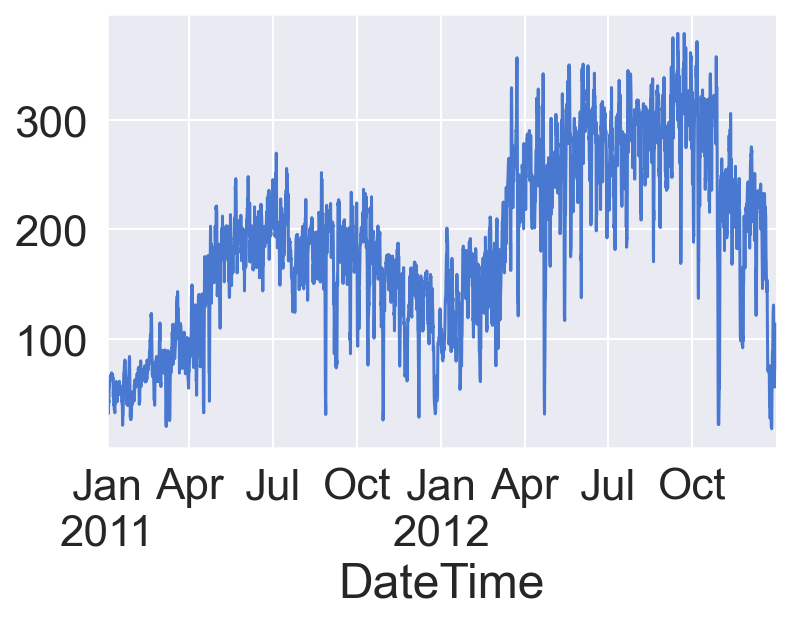

In [17]:
raw_fe['count_trend'].plot()

# 총 2년치 데이터. 그런데, 1년 6개월은 training이지만, test 6개월은 우리가 알 수가 없다. 

Train과 Test기간으로 따로 그림 그려보자. 
- 두개의 패턴은 다르다. 
- 어떻게 해야 현실성이 있는 것일까?

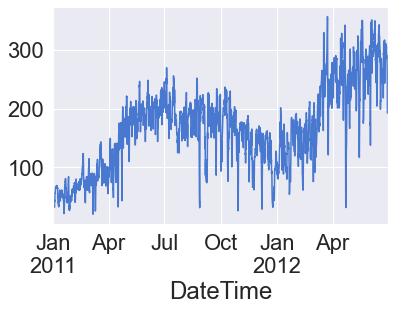

In [10]:
# count_trend plot of train set
raw_fe.loc[X_train_fe.index, 'count_trend'].plot()
plt.show()

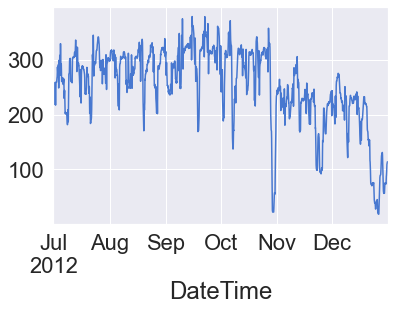

In [11]:
# count_trend plot of test set
raw_fe.loc[X_test_fe.index, 'count_trend'].plot()
plt.show()

In [19]:
X_test_fe.index

DatetimeIndex(['2012-07-01 00:00:00', '2012-07-01 01:00:00',
               '2012-07-01 02:00:00', '2012-07-01 03:00:00',
               '2012-07-01 04:00:00', '2012-07-01 05:00:00',
               '2012-07-01 06:00:00', '2012-07-01 07:00:00',
               '2012-07-01 08:00:00', '2012-07-01 09:00:00',
               ...
               '2012-12-31 14:00:00', '2012-12-31 15:00:00',
               '2012-12-31 16:00:00', '2012-12-31 17:00:00',
               '2012-12-31 18:00:00', '2012-12-31 19:00:00',
               '2012-12-31 20:00:00', '2012-12-31 21:00:00',
               '2012-12-31 22:00:00', '2012-12-31 23:00:00'],
              dtype='datetime64[ns]', name='DateTime', length=4416, freq='H')

In [24]:
len(raw_fe.loc['2012-01-01':'2012-12-31', 'count_trend'])

8784

In [25]:
len(raw_fe.loc['2011-01-01':'2011-12-31', 'count_trend'])

8760

In [28]:
sum(raw_fe.isnull().sum())

0

Frequency도 잘 반영되있고, NaN도 없는데 어떻게 데이터 갯수가 차이가 나지?
- 이게 데이터 분석의 현실, 완벽해 보이는데 우리가 뭔가 놓친거야. 
- 24개가 어디서 비는걸까?, 하루치 데이터가 없다는 것. 
- 11년 2월 29일 데이터가 없네. 윤달이라 없는거네. 

In [30]:
raw_fe.loc['2012-02-29', 'count_trend']

DateTime
2012-02-29 00:00:00   139.69
2012-02-29 01:00:00   134.96
2012-02-29 02:00:00   130.96
2012-02-29 03:00:00   127.75
2012-02-29 04:00:00   123.67
2012-02-29 05:00:00   115.40
2012-02-29 06:00:00   104.27
2012-02-29 07:00:00    94.67
2012-02-29 08:00:00    88.19
2012-02-29 09:00:00    82.85
2012-02-29 10:00:00    78.79
2012-02-29 11:00:00    77.17
2012-02-29 12:00:00    76.06
2012-02-29 13:00:00    75.75
2012-02-29 14:00:00    75.92
2012-02-29 15:00:00    75.98
2012-02-29 16:00:00    76.06
2012-02-29 17:00:00    75.90
2012-02-29 18:00:00    75.77
2012-02-29 19:00:00    76.94
2012-02-29 20:00:00    87.96
2012-02-29 21:00:00   103.08
2012-02-29 22:00:00   110.81
2012-02-29 23:00:00   116.67
Freq: H, Name: count_trend, dtype: float64

In [29]:
# raw_fe.loc['2012-01-01':'2012-12-31', 'count_trend'] = raw_fe.loc['2011-01-01':'2011-12-31', 'count_trend'].values
# 두 갯수가 달라서 에러가 난다. 
raw_fe.loc['2011-02-29', 'count_trend']

KeyError: '2011-02-29'

In [15]:
# raw_fe.loc['2012-01-01':'2012-12-31', 'count_trend'] = raw_fe.loc['2011-01-01':'2011-12-31', 'count_trend'].values
# raw_fe.loc['2012-01-01', 'count_trend']

In [16]:
# raw_fe.loc['2012-01-01':'2012-12-31', 'count_trend'].shape, raw_fe.loc['2011-01-01':'2011-12-31', 'count_trend'].shape

In [17]:
# raw_fe.loc['2012-02-29', 'count_trend']
# raw_fe.loc['2011-02-29', 'count_trend']

In [35]:
# date duplicattion by rules
raw_fe.loc['2012-01-01':'2012-02-28', 'count_trend'] = raw_fe.loc['2011-01-01':'2011-02-28', 'count_trend'].values
raw_fe.loc['2012-03-01':'2012-12-31', 'count_trend'] = raw_fe.loc['2011-03-01':'2011-12-31', 'count_trend'].values
# 2012-02-29??

# 3월 1일 00시와 2월 28일 23시 사이를 25개로 나눈 다음에, 그걸 step으로 정해서
# step을 하나씩 증가시키는 방향으로 넣은 것. 
# raw_fe.loc['2012-02-27':'2012-03-03', 'count_trend']
# raw_fe.loc['2012-02-28':'2012-03-01', 'count_trend']
# raw_fe.loc['2012-02-28 23:00:00', 'count_trend']
# raw_fe.loc['2012-03-01 00:00:00', 'count_trend']
step = (raw_fe.loc['2011-03-01 00:00:00', 'count_trend'] - raw_fe.loc['2011-02-28 23:00:00', 'count_trend'])/25
step_value = np.arange(raw_fe.loc['2011-02-28 23:00:00', 'count_trend']+step, 
                       raw_fe.loc['2011-03-01 00:00:00', 'count_trend'], step)
step_value = step_value[:24]
raw_fe.loc['2012-02-29', 'count_trend'] = step_value

In [37]:
raw_fe.loc['2012-02-28 22:00:00':'2012-03-01 02:00:00', 'count_trend']

DateTime
2012-02-28 22:00:00   57.62
2012-02-28 23:00:00   56.48
2012-02-29 00:00:00   56.49
2012-02-29 01:00:00   56.51
2012-02-29 02:00:00   56.53
2012-02-29 03:00:00   56.54
2012-02-29 04:00:00   56.56
2012-02-29 05:00:00   56.57
2012-02-29 06:00:00   56.59
2012-02-29 07:00:00   56.61
2012-02-29 08:00:00   56.62
2012-02-29 09:00:00   56.64
2012-02-29 10:00:00   56.65
2012-02-29 11:00:00   56.67
2012-02-29 12:00:00   56.68
2012-02-29 13:00:00   56.70
2012-02-29 14:00:00   56.72
2012-02-29 15:00:00   56.73
2012-02-29 16:00:00   56.75
2012-02-29 17:00:00   56.76
2012-02-29 18:00:00   56.78
2012-02-29 19:00:00   56.80
2012-02-29 20:00:00   56.81
2012-02-29 21:00:00   56.83
2012-02-29 22:00:00   56.84
2012-02-29 23:00:00   56.86
2012-03-01 00:00:00   56.88
2012-03-01 01:00:00   58.88
2012-03-01 02:00:00   60.96
Freq: H, Name: count_trend, dtype: float64

<AxesSubplot:xlabel='DateTime'>

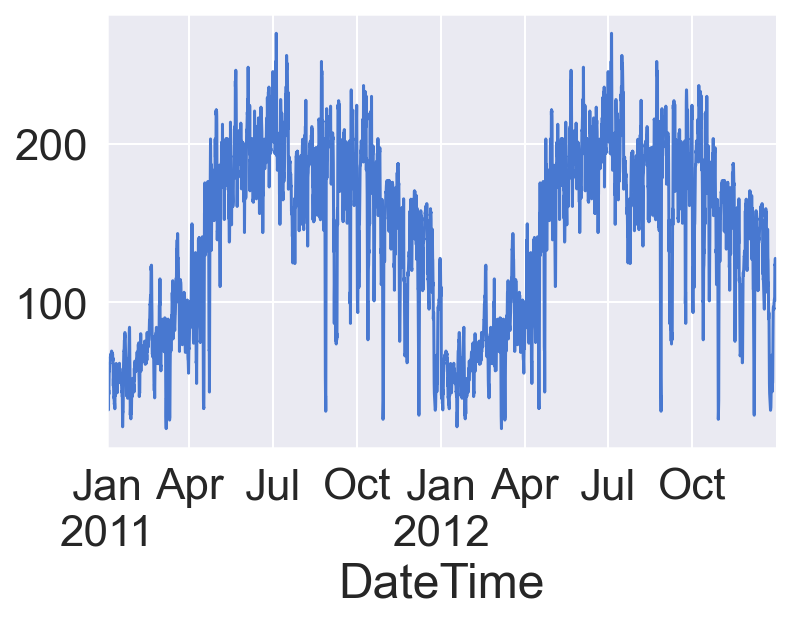

In [38]:
# result of duplication
raw_fe['count_trend'].plot()

이론적인 내용이 아닌, 현실적인 내용. 
- 지금 trend만 한건데, 테스트 기간에 알 수 없는 애들은 싹다 이거 해야돼. 

In [41]:
raw_fe.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count',
       'count_trend', 'count_seasonal', 'count_Day', 'count_Week',
       'count_diff', 'temp_group', 'Year', 'Quater_ver2', 'Month', 'Day',
       'Hour', 'DayofWeek', 'count_lag1', 'count_lag2', 'Quater_Dummy_2',
       'Quater_Dummy_3', 'Quater_Dummy_4'],
      dtype='object')

In [42]:
### Functionalize
### duplicate previous year values to next one
def feature_engineering_year_duplicated(raw, target):
    raw_fe = raw.copy()
    for col in target:
        raw_fe.loc['2012-01-01':'2012-02-28', col] = raw.loc['2011-01-01':'2011-02-28', col].values
        raw_fe.loc['2012-03-01':'2012-12-31', col] = raw.loc['2011-03-01':'2011-12-31', col].values
        step = (raw.loc['2011-03-01 00:00:00', col] - raw.loc['2011-02-28 23:00:00', col])/25
        step_value = np.arange(raw.loc['2011-02-28 23:00:00', col]+step, raw.loc['2011-03-01 00:00:00', col], step)
        step_value = step_value[:24]
        raw_fe.loc['2012-02-29', col] = step_value
    return raw_fe
target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
raw_fe = feature_engineering_year_duplicated(raw_fe, target)

<AxesSubplot:xlabel='DateTime'>

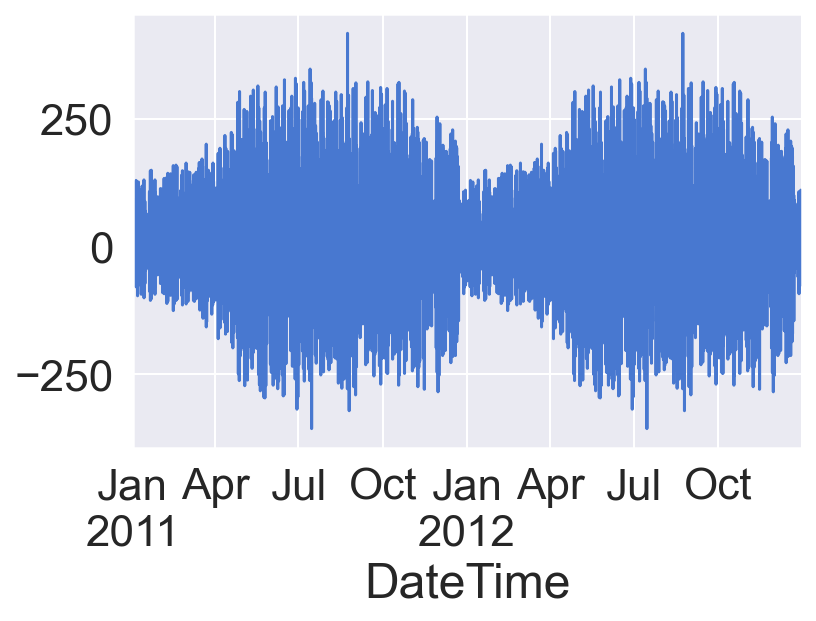

In [43]:
# result of duplication
raw_fe['count_diff'].plot()

![1_10.png](./materials/1_10.png)

In [23]:
# count_lag1, count_lag2
raw_fe.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,count_trend,count_seasonal,count_Day,count_Week,count_diff,temp_group,Year,Quater_ver2,Month,Day,Hour,DayofWeek,count_lag1,count_lag2,Quater_Dummy_2,Quater_Dummy_3,Quater_Dummy_4
DateTime,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-01-01 00:00:00,2011-01-01 00:00:00,1,0,0,1,9.84,14.39,81,0.00,3,13,16,41.06,-134.25,41.04,56.11,24.00,"(8.856, 12.874]",2011,1,1,1,0,5,16.00,16.00,0,0,0
2011-01-01 01:00:00,2011-01-01 01:00:00,1,0,0,1,9.02,13.63,80,0.00,8,32,40,41.06,-154.75,41.04,56.11,24.00,"(8.856, 12.874]",2011,1,1,1,1,5,16.00,16.00,0,0,0
2011-01-01 02:00:00,2011-01-01 02:00:00,1,0,0,1,9.02,13.63,80,0.00,5,27,32,41.06,-165.27,41.04,56.11,-8.00,"(8.856, 12.874]",2011,1,1,1,2,5,40.00,16.00,0,0,0
2011-01-01 03:00:00,2011-01-01 03:00:00,1,0,0,1,9.84,14.39,75,0.00,3,10,13,41.06,-176.48,41.04,56.11,-19.00,"(8.856, 12.874]",2011,1,1,1,3,5,32.00,40.00,0,0,0
2011-01-01 04:00:00,2011-01-01 04:00:00,1,0,0,1,9.84,14.39,75,0.00,0,1,1,41.06,-181.67,41.04,56.11,-12.00,"(8.856, 12.874]",2011,1,1,1,4,5,13.00,32.00,0,0,0


In [24]:
Y_test_fe.shift(2)

,count
DateTime,
2012-07-01 00:00:00,nan
2012-07-01 01:00:00,nan
2012-07-01 02:00:00,149.00
2012-07-01 03:00:00,93.00
2012-07-01 04:00:00,90.00
...,...
2012-12-31 19:00:00,164.00
2012-12-31 20:00:00,122.00
2012-12-31 21:00:00,119.00


train은 그냥 두면 된다. 

In [46]:
X_test_fe['count_lag1']

DateTime
2012-07-01 00:00:00   152.00
2012-07-01 01:00:00   149.00
2012-07-01 02:00:00    93.00
2012-07-01 03:00:00    90.00
2012-07-01 04:00:00    33.00
                       ...  
2012-12-31 19:00:00   122.00
2012-12-31 20:00:00   119.00
2012-12-31 21:00:00    89.00
2012-12-31 22:00:00    90.00
2012-12-31 23:00:00    61.00
Freq: H, Name: count_lag1, Length: 4416, dtype: float64

In [47]:
# calculation of lag data from Y
X_test_fe['count_lag1'] = Y_test_fe.shift(1).values
X_test_fe['count_lag1'].fillna(method='bfill', inplace=True)
X_test_fe['count_lag2'] = Y_test_fe.shift(2).values
X_test_fe['count_lag2'].fillna(method='bfill', inplace=True)
X_test_fe['count_lag2']

DateTime
2012-07-01 00:00:00   149.00
2012-07-01 01:00:00   149.00
2012-07-01 02:00:00   149.00
2012-07-01 03:00:00    93.00
2012-07-01 04:00:00    90.00
                       ...  
2012-12-31 19:00:00   164.00
2012-12-31 20:00:00   122.00
2012-12-31 21:00:00   119.00
2012-12-31 22:00:00    89.00
2012-12-31 23:00:00    90.00
Freq: H, Name: count_lag2, Length: 4416, dtype: float64

In [48]:
### Functionalize
### modify lagged values of X_test
def feature_engineering_lag_modified(Y_test, X_test, target):
    X_test_lm = X_test.copy()
    for col in target:
        X_test_lm[col] = Y_test.shift(1).values
        X_test_lm[col].fillna(method='bfill', inplace=True)
        X_test_lm[col] = Y_test.shift(2).values
        X_test_lm[col].fillna(method='bfill', inplace=True)
    return X_test_lm
target = ['count_lag1', 'count_lag2']
X_test_fe = feature_engineering_lag_modified(Y_test_fe, X_test_fe, target)

<AxesSubplot:xlabel='DateTime'>

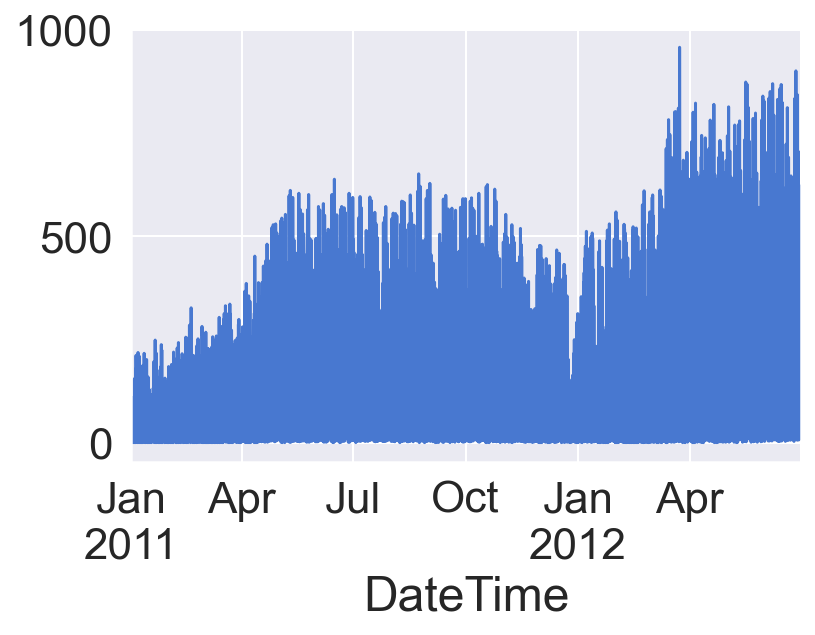

In [49]:
X_train_fe['count_lag2'].plot()

In [52]:
X_test_fe.columns

Index(['season', 'holiday', 'workingday', 'weather', 'temp', 'atemp',
       'humidity', 'windspeed', 'count_trend', 'count_seasonal', 'count_Day',
       'count_Week', 'count_diff', 'Year', 'Quater_ver2', 'Month', 'Day',
       'Hour', 'DayofWeek', 'count_lag1', 'count_lag2', 'Quater_Dummy_2',
       'Quater_Dummy_3', 'Quater_Dummy_4'],
      dtype='object')

In [54]:
X_test_fe.head()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,count_trend,count_seasonal,count_Day,count_Week,count_diff,Year,Quater_ver2,Month,Day,Hour,DayofWeek,count_lag1,count_lag2,Quater_Dummy_2,Quater_Dummy_3,Quater_Dummy_4
DateTime,,,,,,,,,,,,,,,,,,,,,,,,
2012-07-01 00:00:00,3,0,0,1,31.16,36.37,66,0.00,230.42,-134.25,240.29,276.56,-3.00,2012,7,7,1,0,6,149.00,149.00,0,1,0
2012-07-01 01:00:00,3,0,0,1,30.34,34.85,70,9.00,229.46,-154.75,241.75,276.36,-56.00,2012,7,7,1,1,6,149.00,149.00,0,1,0
2012-07-01 02:00:00,3,0,0,1,29.52,34.85,74,6.00,230.02,-165.27,242.96,276.21,-3.00,2012,7,7,1,2,6,149.00,149.00,0,1,0
2012-07-01 03:00:00,3,0,0,1,29.52,35.60,84,9.00,229.52,-176.48,243.38,276.05,-57.00,2012,7,7,1,3,6,93.00,93.00,0,1,0
2012-07-01 04:00:00,3,0,0,1,28.70,33.34,79,13.00,227.04,-181.67,242.79,276.00,-29.00,2012,7,7,1,4,6,90.00,90.00,0,1,0


### Code Summary (Reality)

In [55]:
### Functionalize
### duplicate previous year values to next one
def feature_engineering_year_duplicated(raw, target):
    raw_fe = raw.copy()
    for col in target:
        raw_fe.loc['2012-01-01':'2012-02-28', col] = raw.loc['2011-01-01':'2011-02-28', col].values
        raw_fe.loc['2012-03-01':'2012-12-31', col] = raw.loc['2011-03-01':'2011-12-31', col].values
        step = (raw.loc['2011-03-01 00:00:00', col] - raw.loc['2011-02-28 23:00:00', col])/25
        step_value = np.arange(raw.loc['2011-02-28 23:00:00', col]+step, raw.loc['2011-03-01 00:00:00', col], step)
        step_value = step_value[:24]
        raw_fe.loc['2012-02-29', col] = step_value
    return raw_fe
# target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
# raw_fe = feature_engineering_year_duplicated(raw_fe, target)

### modify lagged values of X_test
def feature_engineering_lag_modified(Y_test, X_test, target):
    X_test_lm = X_test.copy()
    for col in target:
        X_test_lm[col] = Y_test.shift(1).values
        X_test_lm[col].fillna(method='bfill', inplace=True)
        X_test_lm[col] = Y_test.shift(2).values
        X_test_lm[col].fillna(method='bfill', inplace=True)
    return X_test_lm
# target = ['count_lag1', 'count_lag2']
# X_test_fe = feature_engineering_lag_modified(Y_test_fe, X_test_fe, target)

고작 이거 더했다고, 15개가 t-test 유의하다고 나온다. Residual도 엄청 떨어졌다. <br>
너무 단순한 로직으로 update했을 뿐인데, 결과가 훨씬 좋아짐. 

Train_size: (13128, 29) Test_size: (4416, 29)
X_train: (13128, 24) Y_train: (13128, 1)
X_test: (4416, 24) Y_test: (4416, 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  count   R-squared:                       0.909
Model:                            OLS   Adj. R-squared:                  0.908
Method:                 Least Squares   F-statistic:                     5658.
Date:                Sun, 21 Nov 2021   Prob (F-statistic):               0.00
Time:                        01:32:00   Log-Likelihood:                -69618.
No. Observations:               13128   AIC:                         1.393e+05
Df Residuals:                   13104   BIC:                         1.395e+05
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
season             2.7535      0.952      2.893      0.004       0.888       4.619
holiday            0.6180      3.170      0.195      0.845      -5.595       6.831
workingday         2.1960      1.544      1.423      0.155      -0.830       5.222
weather           -5.8817      0.780     -7.544      0.000      -7.410      -4.353
temp               0.5622      0.490      1.146      0.252      -0.399       1.523
atemp              0.4042      0.427      0.946      0.344      -0.433       1.242
humidity          -0.0706      0.028     -2.501      0.012      -0.126      -0.015
windspeed         -0.1216      0.057     -2.117      0.034      -0.234      -0.009
count_trend        0.0718      0.024      3.007      0.003       0.025       0.119
count_seasonal     0.1948      0.006     34.600      0.000       0.184       0.206
count_Day          0.1011      0.024      4.190      0.000       0.054       0.148
count_Week        -0.0801      0.026     -3.078      0.002      -0.131      -0.029
count_diff         0.7146      0.007     97.737      0.000       0.700       0.729
Year               0.0004      0.002      0.188      0.851      -0.003       0.004
Quater_ver2        5.6849      0.284     19.988      0.000       5.127       6.242
Month              1.1013      0.566      1.945      0.052      -0.009       2.211
Day               -0.0335      0.049     -0.681      0.496      -0.130       0.063
Hour               0.1185      0.083      1.420      0.156      -0.045       0.282
DayofWeek          0.3611      0.354      1.021      0.307      -0.332       1.055
count_lag1         0.9285      0.006    149.851      0.000       0.916       0.941
count_lag2        -0.1938      0.006    -33.734      0.000      -0.205      -0.183
Quater_Dummy_2    -7.2671      2.213     -3.284      0.001     -11.605      -2.929
Quater_Dummy_3   -21.5188      3.728     -5.773      0.000     -28.825     -14.212
Quater_Dummy_4   -26.7509      5.511     -4.854      0.000     -37.554     -15.948
==============================================================================
Omnibus:                     3715.248   Durbin-Watson:                   1.582
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           115549.958
Skew:                           0.728   Prob(JB):                         0.00
Kurtosis:                      17.461   Cond. No.                     3.22e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.22e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

,MAE,MSE,MAPE
Train,27.79,"2,364.05",82.11
Test,113.99,"26,316.17",133.61


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-13.45,0.06,0.78,572.93,744.23,"2,927.28","7,390.92","46,108.47"
p-value,0.00,0.10,0.00,0.00,0.00,0.00,0.00,0.00
Used Lag,41.00,460.00,NaN,NaN,NaN,NaN,NaN,NaN
Used Observations,"13,086.00",NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(1%),-3.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Maximum Information Criteria,"133,771.72",NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(10%),NaN,0.35,NaN,NaN,NaN,NaN,NaN,NaN
Alternative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,two-sided


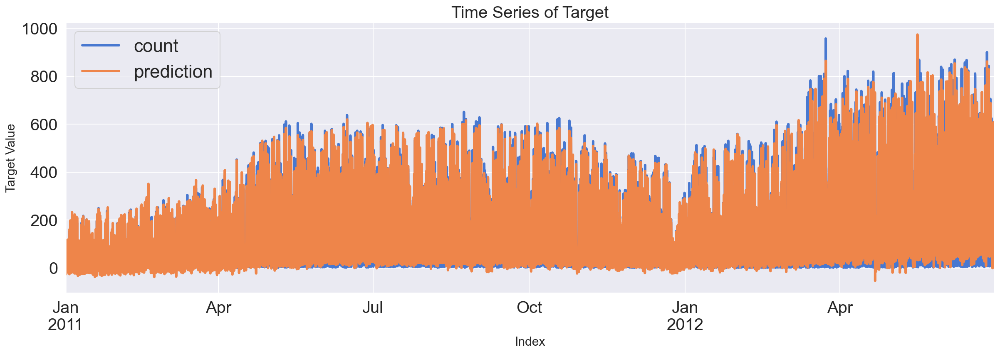

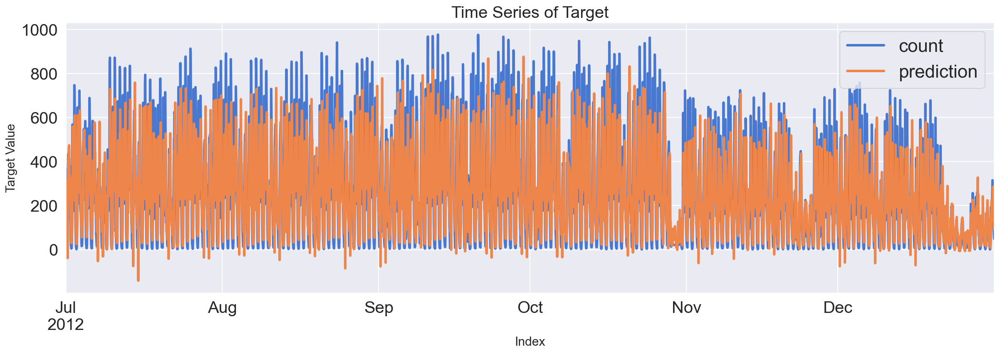

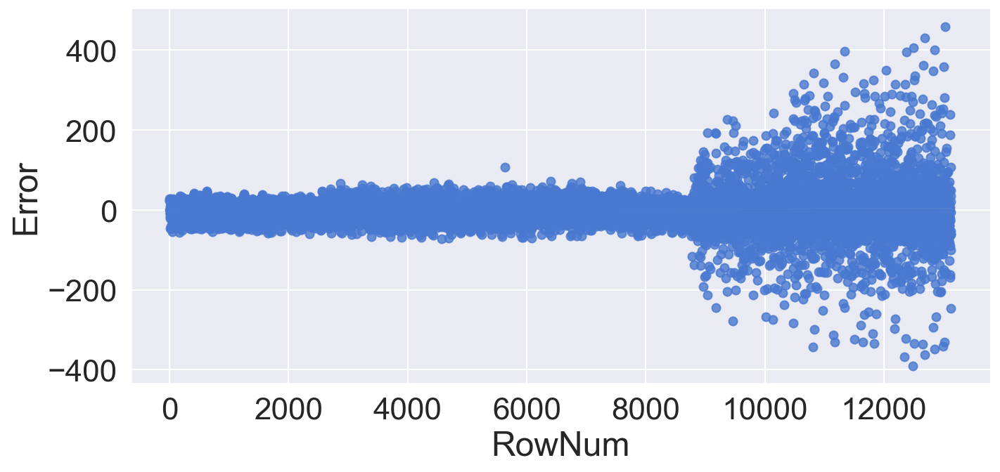

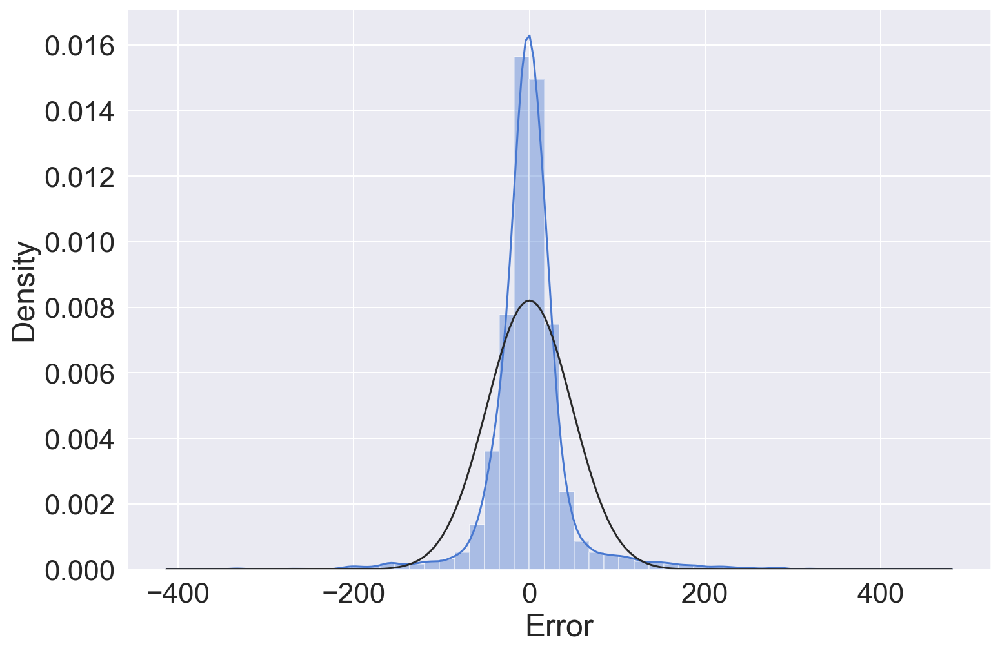

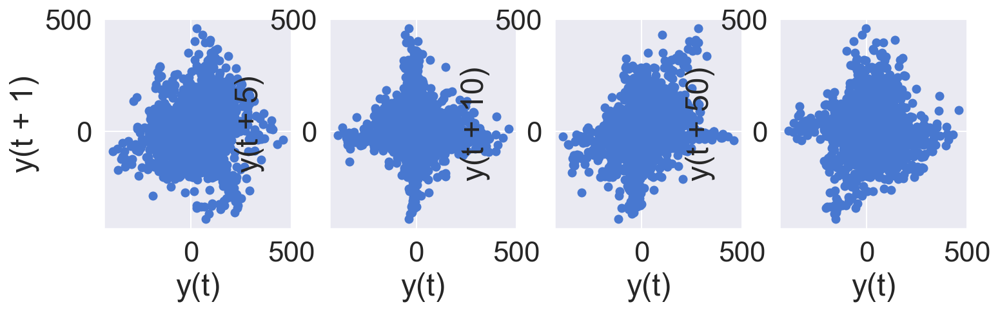

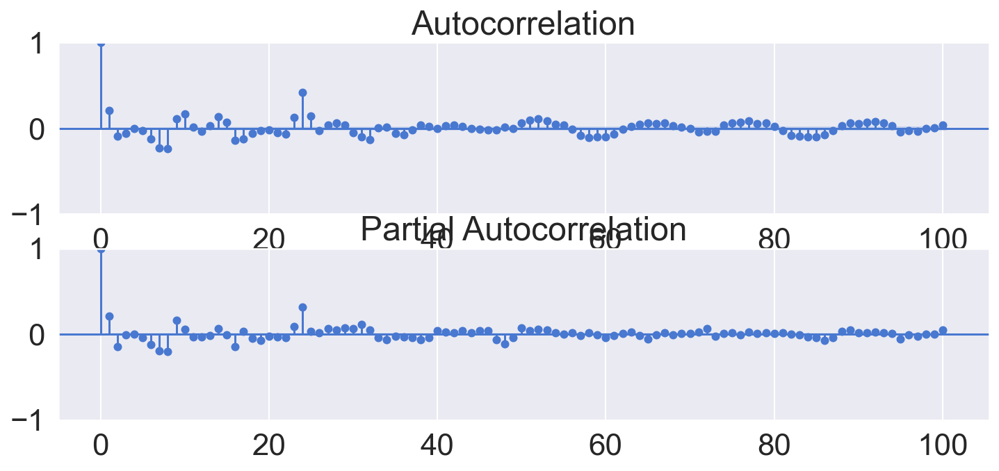

In [56]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './lecture_source/OnlineTSA-master/Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_fe = feature_engineering(raw_all)


### Reality ###
target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
raw_feR = feature_engineering_year_duplicated(raw_fe, target)
###############

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train_feR, X_test_feR, Y_train_feR, Y_test_feR = datasplit_ts(raw_feR, Y_colname, X_colname, '2012-07-01')


### Reality ###
target = ['count_lag1', 'count_lag2']
X_test_feR = feature_engineering_lag_modified(Y_test_feR, X_test_feR, target)
###############

# Applying Base Model
fit_reg1_feR = sm.OLS(Y_train_feR, X_train_feR).fit()
display(fit_reg1_feR.summary())
pred_tr_reg1_feR = fit_reg1_feR.predict(X_train_feR).values
pred_te_reg1_feR = fit_reg1_feR.predict(X_test_feR).values

# Evaluation
Score_reg1_feR, Resid_tr_reg1_feR, Resid_te_reg1_feR = evaluation_trte(Y_train_feR, pred_tr_reg1_feR,
                                                                   Y_test_feR, pred_te_reg1_feR, graph_on=True)
display(Score_reg1_feR)

# Error Analysis
error_analysis(Resid_tr_reg1_feR, ['Error'], X_train_feR, graph_on=True)

In [57]:
display(Score_reg1_rd)
display(Score_reg1_fe)
display(Score_reg1_feR)

,MAE,MSE,MAPE
Train,103.09,"19,360.42",458.48
Test,150.03,"43,410.27",316.61


,MAE,MSE,MAPE
Train,0.01,0.04,0.06
Test,0.01,0.00,0.03


,MAE,MSE,MAPE
Train,27.79,"2,364.05",82.11
Test,113.99,"26,316.17",133.61


## 변수간스케일조정

In [58]:
scaler = preprocessing.MinMaxScaler()
scaler_fit = scaler.fit(X_train_feR)
X_train_feRS = pd.DataFrame(scaler_fit.transform(X_train_feR), 
                                       index=X_train_feR.index, columns=X_train_feR.columns)
X_test_feRS = pd.DataFrame(scaler_fit.transform(X_test_feR), 
                           index=X_test_feR.index, columns=X_test_feR.columns)
X_test_feRS.describe().T

,count,mean,std,min,25%,50%,75%,max
season,"4,416.00",0.79,0.26,0.00,0.67,0.67,1.00,1.00
holiday,"4,416.00",0.03,0.18,0.00,0.00,0.00,0.00,1.00
workingday,"4,416.00",0.68,0.47,0.00,0.00,1.00,1.00,1.00
weather,"4,416.00",0.15,0.21,0.00,0.00,0.00,0.33,0.67
temp,"4,416.00",0.54,0.20,0.12,0.35,0.56,0.71,1.02
atemp,"4,416.00",0.51,0.17,0.15,0.36,0.53,0.65,0.91
humidity,"4,416.00",0.64,0.17,0.16,0.50,0.65,0.78,1.00
windspeed,"4,416.00",0.20,0.14,0.00,0.12,0.19,0.30,0.77
count_trend,"4,416.00",0.57,0.18,0.02,0.48,0.60,0.70,1.00
count_seasonal,"4,416.00",0.40,0.28,0.00,0.14,0.45,0.54,1.00


In [59]:
# calculation from scaling parameters and fitting to test set
scaler = preprocessing.MinMaxScaler()
scaler_fit = scaler.fit(X_train_feR)
X_train_feRS = pd.DataFrame(scaler_fit.transform(X_train_feR), 
                           index=X_train_feR.index, columns=X_train_feR.columns)
X_test_feRS = pd.DataFrame(scaler_fit.transform(X_test_feR), 
                           index=X_test_feR.index, columns=X_test_feR.columns)

In [64]:
X_test_feRS.head()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,count_trend,count_seasonal,count_Day,count_Week,count_diff,Year,Quater_ver2,Month,Day,Hour,DayofWeek,count_lag1,count_lag2,Quater_Dummy_2,Quater_Dummy_3,Quater_Dummy_4
DateTime,,,,,,,,,,,,,,,,,,,,,,,,
2012-07-01 00:00:00,0.00,0.00,0.00,0.00,0.02,0.02,0.03,0.00,0.11,-0.06,0.11,0.10,-0.03,0.97,0.00,0.00,0.00,0.00,0.00,0.07,0.07,0.00,0.00,0.00
2012-07-01 01:00:00,0.00,0.00,0.00,0.00,0.01,0.02,0.03,0.00,0.11,-0.07,0.11,0.10,-0.02,0.97,0.00,0.00,0.00,0.00,0.00,0.07,0.07,0.00,0.00,0.00
2012-07-01 02:00:00,0.00,0.00,0.00,0.00,0.01,0.02,0.04,0.00,0.11,-0.08,0.11,0.10,-0.01,0.97,0.00,0.00,0.00,0.00,0.00,0.07,0.07,0.00,0.00,0.00
2012-07-01 03:00:00,0.00,0.00,0.00,0.00,0.01,0.02,0.04,0.00,0.12,-0.09,0.11,0.10,-0.00,0.97,0.00,0.00,0.00,0.00,0.00,0.05,0.05,0.00,0.00,0.00
2012-07-01 04:00:00,0.00,0.00,0.00,0.00,0.01,0.02,0.04,0.01,0.12,-0.09,0.11,0.10,-0.00,0.97,0.00,0.00,0.00,0.00,0.00,0.04,0.04,0.00,0.00,0.00


### Code Summary (Scaling)

In [65]:
### Functionalize
### scaling of X_train and X_test by X_train_scaler
def feature_engineering_scaling(scaler, X_train, X_test):
    # preprocessing.MinMaxScaler()
    # preprocessing.StandardScaler()
    # preprocessing.RobustScaler()
    # preprocessing.Normalizer()
    scaler = scaler
    scaler_fit = scaler.fit(X_train)
    X_train_scaling = pd.DataFrame(scaler_fit.transform(X_train), 
                               index=X_train.index, columns=X_train.columns)
    X_test_scaling = pd.DataFrame(scaler_fit.transform(X_test), 
                               index=X_test.index, columns=X_test.columns)
    return X_train_scaling, X_test_scaling
# X_train_feRS, X_test_feRS = feature_engineering_scaling(preprocessing.Normalizer(), X_train_feR, X_test_feR)

Train_size: (13128, 29) Test_size: (4416, 29)
X_train: (13128, 24) Y_train: (13128, 1)
X_test: (4416, 24) Y_test: (4416, 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  count   R-squared (uncentered):                   0.957
Model:                            OLS   Adj. R-squared (uncentered):              0.956
Method:                 Least Squares   F-statistic:                          1.201e+04
Date:                Sun, 21 Nov 2021   Prob (F-statistic):                        0.00
Time:                        03:47:51   Log-Likelihood:                         -69508.
No. Observations:               13128   AIC:                                  1.391e+05
Df Residuals:                   13104   BIC:                                  1.392e+05
Df Model:                          24                                                  
Covariance Type:            nonrobust                                                  
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
season          4315.6193   1933.052      2.233      0.026     526.557    8104.681
holiday         -409.2134   6443.851     -0.064      0.949    -1.3e+04    1.22e+04
workingday      2915.8573   3150.917      0.925      0.355   -3260.397    9092.112
weather        -1.105e+04   1587.055     -6.965      0.000   -1.42e+04   -7943.631
temp            1593.7972   1005.124      1.586      0.113    -376.391    3563.986
atemp            112.3002    874.853      0.128      0.898   -1602.538    1827.138
humidity        -112.4943     57.480     -1.957      0.050    -225.163       0.174
windspeed       -241.9981    117.465     -2.060      0.039    -472.246     -11.750
count_trend      119.3792     48.631      2.455      0.014      24.055     214.703
count_seasonal   356.4902     11.505     30.985      0.000     333.938     379.042
count_Day        203.8292     49.125      4.149      0.000     107.538     300.120
count_Week      -114.3462     53.135     -2.152      0.031    -218.499     -10.194
count_diff      1524.5914     15.184    100.410      0.000    1494.829    1554.354
Year              -2.3743      3.796     -0.626      0.532      -9.815       5.066
Quater_ver2     1.118e+04    578.212     19.343      0.000    1.01e+04    1.23e+04
Month           2308.4692   1155.318      1.998      0.046      43.878    4573.060
Day              -42.2992    100.152     -0.422      0.673    -238.611     154.013
Hour             -88.0027    169.788     -0.518      0.604    -420.811     244.806
DayofWeek        298.0309    722.036      0.413      0.680   -1117.264    1713.326
count_lag1      2036.3774     12.950    157.255      0.000    2010.994    2061.760
count_lag2      -384.2636     12.038    -31.921      0.000    -407.859    -360.668
Quater_Dummy_2 -1.317e+04   4509.968     -2.919      0.004    -2.2e+04   -4325.329
Quater_Dummy_3 -4.321e+04   7615.435     -5.674      0.000   -5.81e+04   -2.83e+04
Quater_Dummy_4 -5.415e+04   1.13e+04     -4.810      0.000   -7.62e+04   -3.21e+04
==============================================================================
Omnibus:                     3787.573   Durbin-Watson:                   1.578
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           125389.728
Skew:                           0.737   Prob(JB):                         0.00
Kurtosis:                      18.069   Cond. No.                     3.22e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 3.22e+04. This might indicate that ther

,MAE,MSE,MAPE
Train,27.18,"2,324.78",80.36
Test,113.06,"25,908.84",129.35


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-13.69,0.08,0.78,585.36,715.46,"2,798.72","7,261.76",477.22
p-value,0.00,0.10,0.00,0.00,0.00,0.00,0.00,0.00
Used Lag,40.00,660.00,NaN,NaN,NaN,NaN,NaN,NaN
Used Observations,"13,087.00",NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(1%),-3.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Maximum Information Criteria,"133,677.59",NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(10%),NaN,0.35,NaN,NaN,NaN,NaN,NaN,NaN
Alternative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,two-sided


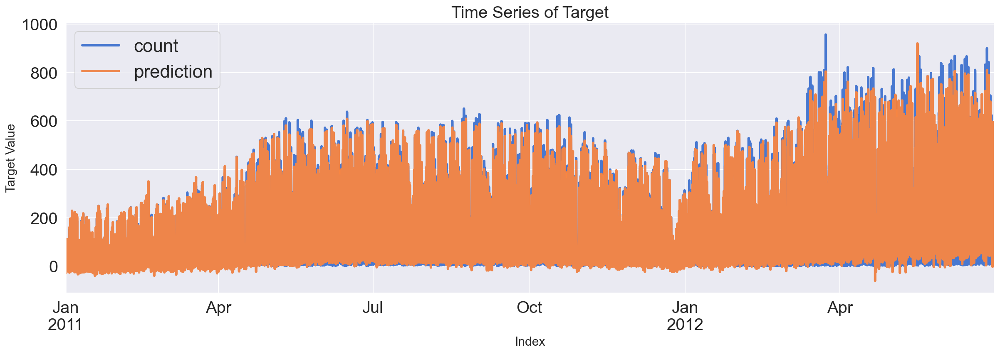

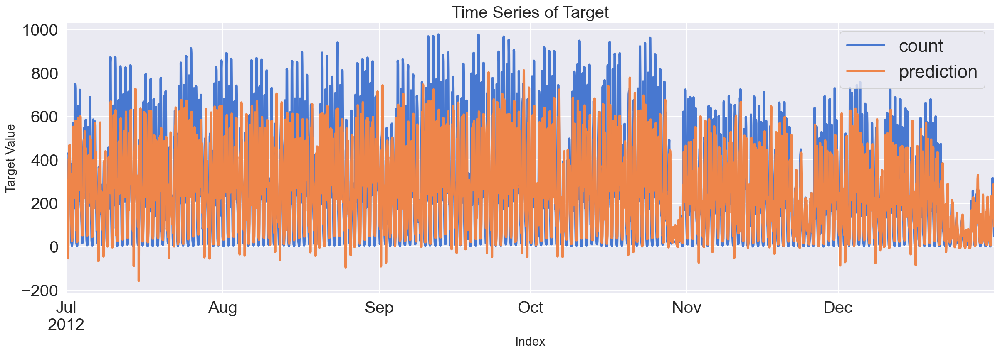

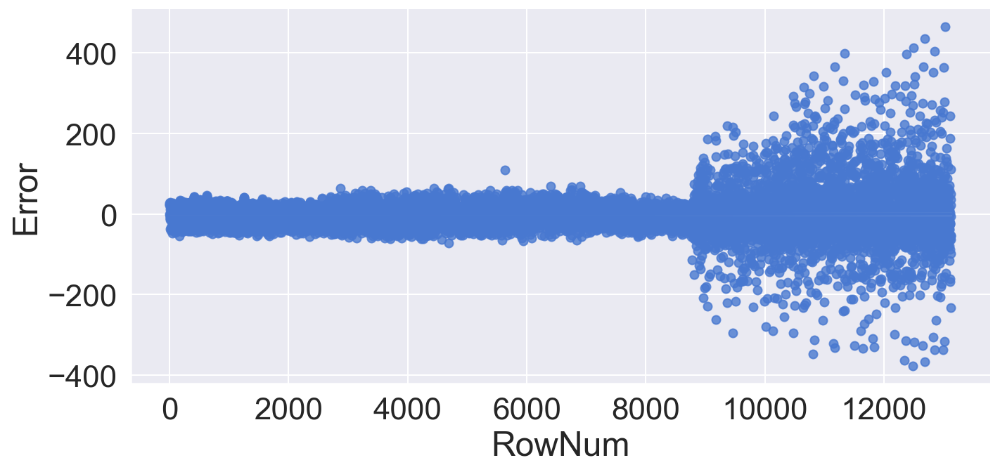

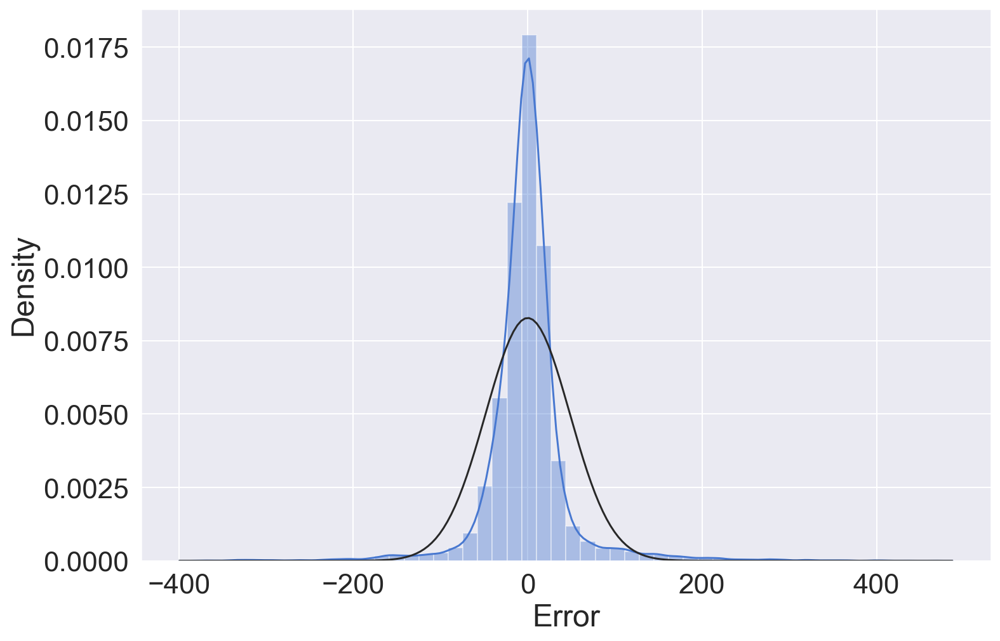

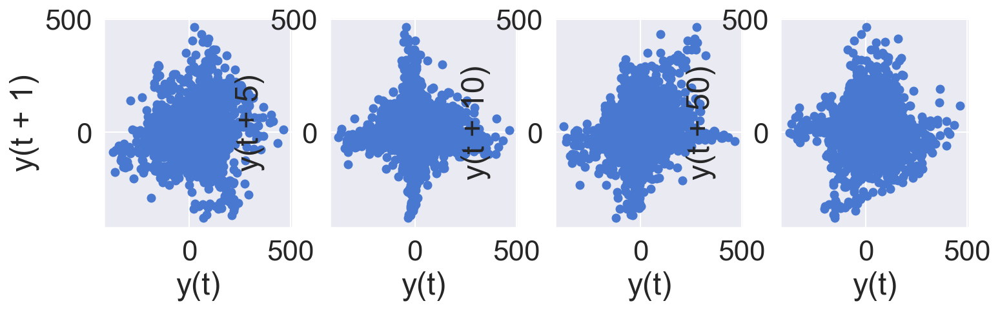

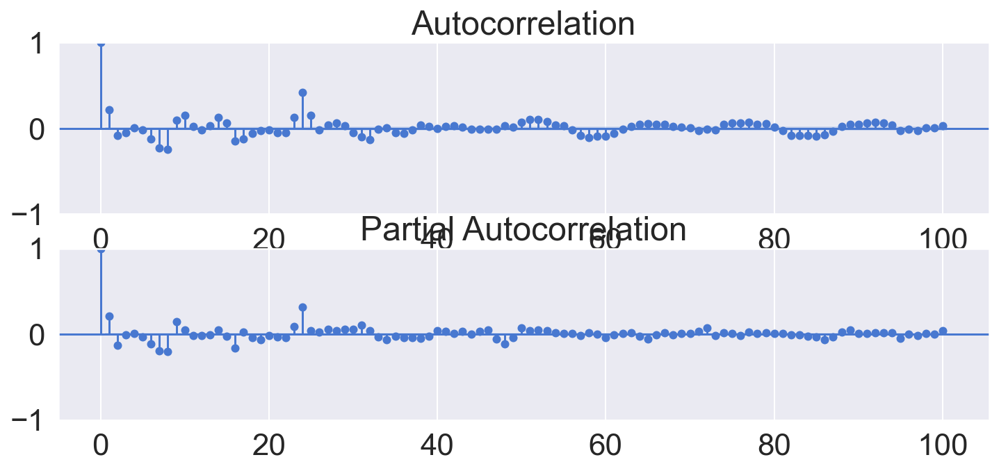

In [67]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './lecture_source/OnlineTSA-master/Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_fe = feature_engineering(raw_all)
### Reality ###
target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
raw_feR = feature_engineering_year_duplicated(raw_fe, target)
###############

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train_feR, X_test_feR, Y_train_feR, Y_test_feR = datasplit_ts(raw_feR, Y_colname, X_colname, '2012-07-01')
### Reality ###
target = ['count_lag1', 'count_lag2']
X_test_feR = feature_engineering_lag_modified(Y_test_feR, X_test_feR, target)
###############


### Scaling ###
X_train_feRS, X_test_feRS = feature_engineering_scaling(preprocessing.Normalizer(), X_train_feR, X_test_feR)
###############



# Applying Base Model
fit_reg1_feRS = sm.OLS(Y_train_feR, X_train_feRS).fit()
display(fit_reg1_feRS.summary())
pred_tr_reg1_feRS = fit_reg1_feRS.predict(X_train_feRS).values
pred_te_reg1_feRS = fit_reg1_feRS.predict(X_test_feRS).values

# Evaluation
Score_reg1_feRS, Resid_tr_reg1_feRS, Resid_te_reg1_feRS = evaluation_trte(Y_train_feR, pred_tr_reg1_feRS,
                                                                   Y_test_feR, pred_te_reg1_feRS, graph_on=True)
display(Score_reg1_feRS)

# Error Analysis
error_analysis(Resid_tr_reg1_feRS, ['Error'], X_train_feRS, graph_on=True)

In [68]:
display(Score_reg1_rd)
display(Score_reg1_fe)
display(Score_reg1_feR)
display(Score_reg1_feRS)

,MAE,MSE,MAPE
Train,103.09,"19,360.42",458.48
Test,150.03,"43,410.27",316.61


,MAE,MSE,MAPE
Train,0.01,0.04,0.06
Test,0.01,0.00,0.03


,MAE,MSE,MAPE
Train,27.79,"2,364.05",82.11
Test,113.99,"26,316.17",133.61


,MAE,MSE,MAPE
Train,27.18,"2,324.78",80.36
Test,113.06,"25,908.84",129.35


## 다중공선성제거

X들 사이 독립성이 깨진 경우. <br>
X들 사이 Correlation이 높은 경우. 

In [71]:
raw_feR.corr()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,count_trend,count_seasonal,count_Day,count_Week,count_diff,Year,Quater_ver2,Month,Day,Hour,DayofWeek,count_lag1,count_lag2,Quater_Dummy_2,Quater_Dummy_3,Quater_Dummy_4
season,1.00,-0.02,0.02,-0.02,0.32,0.33,0.15,-0.14,0.12,0.18,0.18,0.55,0.00,0.55,0.63,0.00,-0.00,0.42,0.83,-0.00,-0.01,-0.01,0.18,0.18,-0.20,0.31,0.60
holiday,-0.02,1.00,-0.26,-0.00,-0.04,-0.04,-0.01,0.01,0.03,-0.05,-0.04,-0.07,-0.00,-0.06,-0.02,-0.00,0.00,0.01,0.01,-0.01,0.01,-0.19,-0.04,-0.04,-0.03,-0.03,0.05
workingday,0.02,-0.26,1.00,0.04,0.05,0.05,0.02,-0.02,-0.30,0.13,0.03,0.02,0.00,0.03,0.01,0.00,0.00,-0.00,-0.00,0.01,-0.00,-0.70,0.03,0.02,0.01,0.01,-0.02
weather,-0.02,-0.00,0.04,1.00,-0.11,-0.11,0.43,0.05,-0.16,-0.13,-0.15,-0.18,-0.00,-0.12,-0.06,-0.01,-0.02,-0.02,0.00,0.01,-0.02,-0.06,-0.14,-0.14,-0.03,-0.07,0.05
temp,0.32,-0.04,0.05,-0.11,1.00,0.99,-0.07,-0.02,0.46,0.34,0.41,0.70,0.17,0.71,0.77,0.00,0.05,0.14,0.21,0.02,0.14,-0.03,0.41,0.40,0.26,0.60,-0.31
atemp,0.33,-0.04,0.05,-0.11,0.99,1.00,-0.06,-0.06,0.46,0.34,0.41,0.70,0.16,0.71,0.76,-0.00,0.05,0.15,0.22,0.02,0.13,-0.03,0.41,0.40,0.27,0.58,-0.29
humidity,0.15,-0.01,0.02,0.43,-0.07,-0.06,1.00,-0.27,-0.35,-0.28,-0.33,0.01,-0.34,0.04,0.13,-0.01,-0.08,0.00,0.16,0.03,-0.27,-0.04,-0.33,-0.31,-0.03,0.06,0.10
windspeed,-0.14,0.01,-0.02,0.05,-0.02,-0.06,-0.27,1.00,0.08,0.07,0.08,-0.16,0.19,-0.16,-0.13,0.02,-0.01,-0.07,-0.13,0.02,0.14,-0.00,0.08,0.06,0.04,-0.10,-0.06
casual,0.12,0.03,-0.30,-0.16,0.46,0.46,-0.35,0.08,1.00,0.51,0.70,0.31,0.44,0.29,0.29,0.07,0.14,0.16,0.07,-0.01,0.30,0.24,0.65,0.58,0.15,0.17,-0.10
registered,0.18,-0.05,0.13,-0.13,0.34,0.34,-0.28,0.07,0.51,1.00,0.97,0.25,0.71,0.25,0.23,0.21,0.26,0.28,0.13,-0.01,0.37,-0.08,0.80,0.53,0.06,0.13,-0.00


In [70]:
raw_feR.corr().loc[:, ['casual', 'registered', 'count']]

,casual,registered,count
season,0.12,0.18,0.18
holiday,0.03,-0.05,-0.04
workingday,-0.30,0.13,0.03
weather,-0.16,-0.13,-0.15
temp,0.46,0.34,0.41
atemp,0.46,0.34,0.41
humidity,-0.35,-0.28,-0.33
windspeed,0.08,0.07,0.08
casual,1.00,0.51,0.70
registered,0.51,1.00,0.97


X와 Y의 관계는 Cor이 높은 것이 좋다. 

In [72]:
# correlation from features
raw_feR.corr().loc[:, ['casual', 'registered', 'count']].style.background_gradient().set_precision(2).set_properties(**{'font-size': '11pt'})
# count_trend, count_seasonal, count_Day, count_Week, count_diff, Hour, count_lag1, count_lag2

# Y값인 casual, registered, count외에도 높은게 뭐가 있나 COR이 높은 것을 체크해 놓은 것. 


,casual,registered,count
season,0.12,0.18,0.18
holiday,0.03,-0.05,-0.04
workingday,-0.30,0.13,0.03
weather,-0.16,-0.13,-0.15
temp,0.46,0.34,0.41
atemp,0.46,0.34,0.41
humidity,-0.35,-0.28,-0.33
windspeed,0.08,0.07,0.08
casual,1.00,0.51,0.70
registered,0.51,1.00,0.97


In [73]:
raw_feR.describe()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,count_trend,count_seasonal,count_Day,count_Week,count_diff,Year,Quater_ver2,Month,Day,Hour,DayofWeek,count_lag1,count_lag2,Quater_Dummy_2,Quater_Dummy_3,Quater_Dummy_4
count,"17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00"
mean,2.50,0.03,0.68,1.43,20.30,23.71,62.87,12.81,35.35,152.44,187.80,141.91,-0.16,141.82,141.60,-0.04,"2,011.50",4.51,6.52,15.74,11.51,3.00,187.79,187.79,0.25,0.25,0.25
std,1.11,0.17,0.47,0.65,7.92,8.62,19.34,8.29,49.19,151.28,181.35,56.89,128.49,57.02,51.15,75.16,0.50,2.29,3.45,8.80,6.94,2.01,181.35,181.35,0.43,0.43,0.43
min,1.00,0.00,0.00,1.00,0.82,0.00,0.00,0.00,0.00,0.00,1.00,20.00,-181.67,19.96,45.95,-357.00,"2,011.00",1.00,1.00,1.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00
25%,2.00,0.00,0.00,1.00,13.94,16.66,48.00,7.00,4.00,32.00,38.00,88.45,-125.09,88.33,94.80,-32.00,"2,011.00",3.00,4.00,8.00,5.00,1.00,38.00,38.00,0.00,0.00,0.00
50%,3.00,0.00,1.00,1.00,20.50,24.24,63.00,13.00,16.00,114.00,140.00,155.10,19.32,155.19,159.72,-3.00,"2,012.00",5.00,7.00,16.00,12.00,3.00,140.00,140.00,0.00,0.00,0.00
75%,3.00,0.00,1.00,2.00,27.06,31.06,79.00,17.00,48.00,219.00,279.00,190.04,64.52,190.12,185.03,23.00,"2,012.00",7.00,10.00,23.00,17.25,5.00,279.00,279.00,0.00,1.00,1.00
max,4.00,1.00,1.00,4.00,41.00,50.00,100.00,57.00,367.00,886.00,977.00,269.65,273.37,269.88,217.98,417.00,"2,012.00",8.00,12.00,31.00,23.00,6.00,977.00,977.00,1.00,1.00,1.00


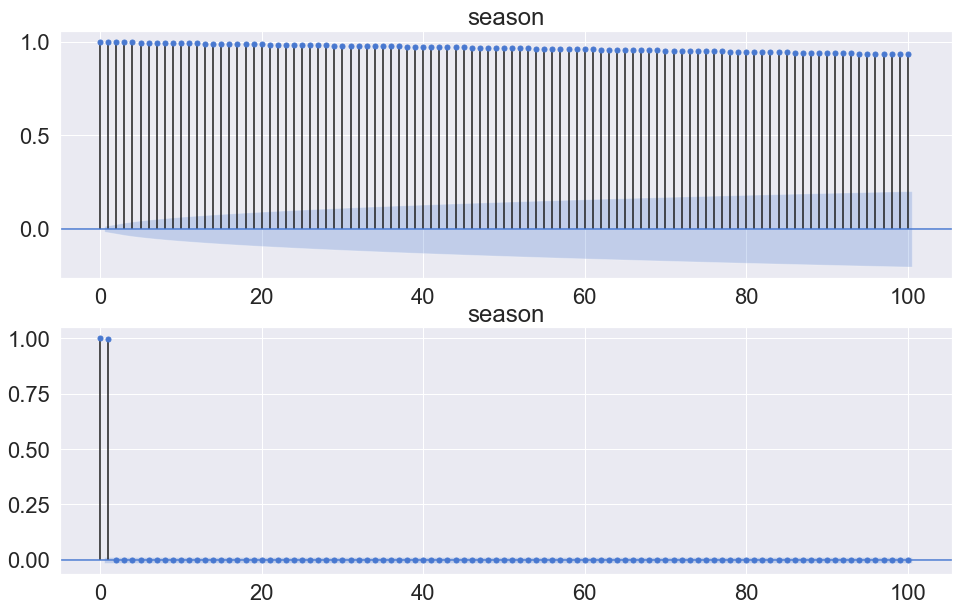

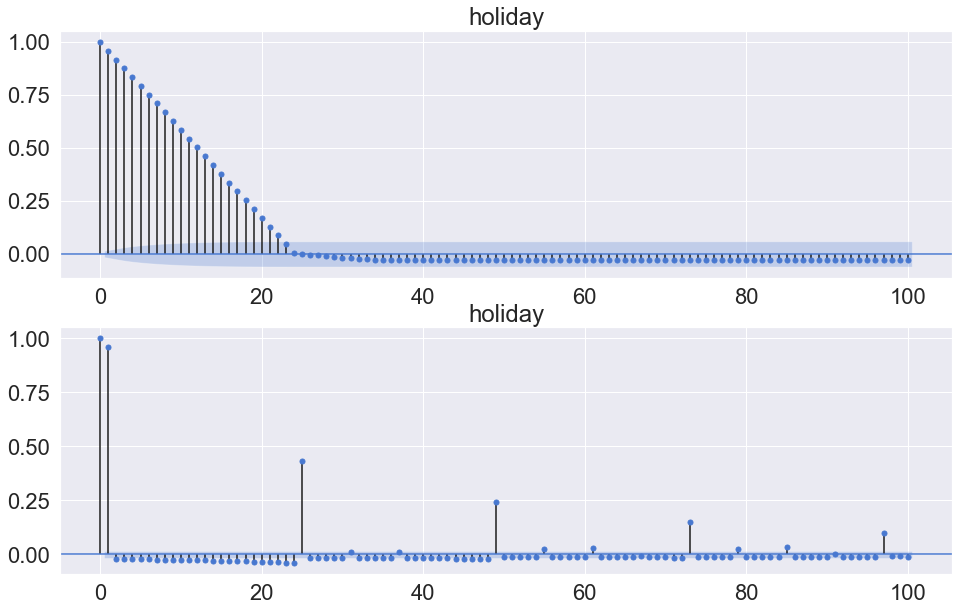

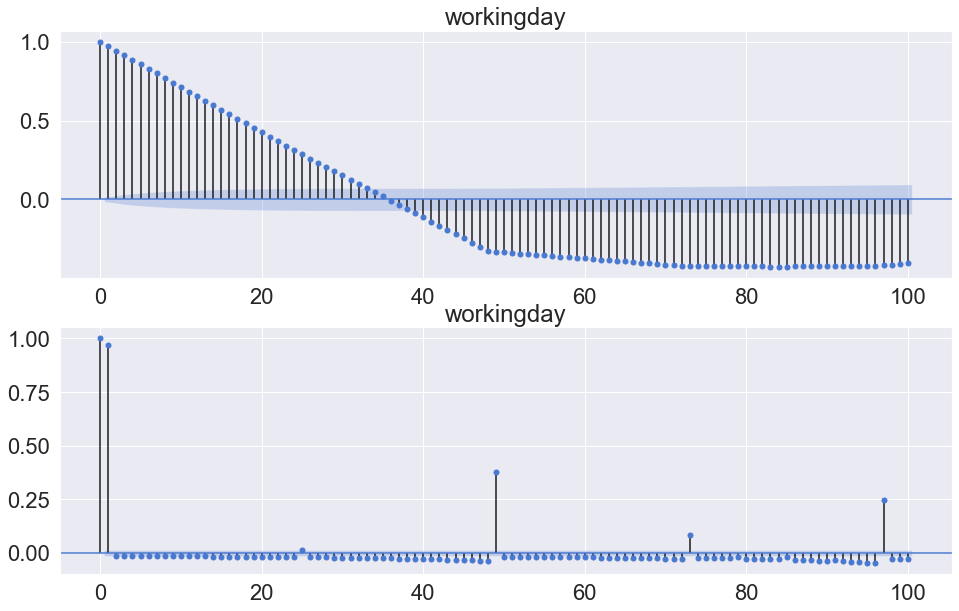

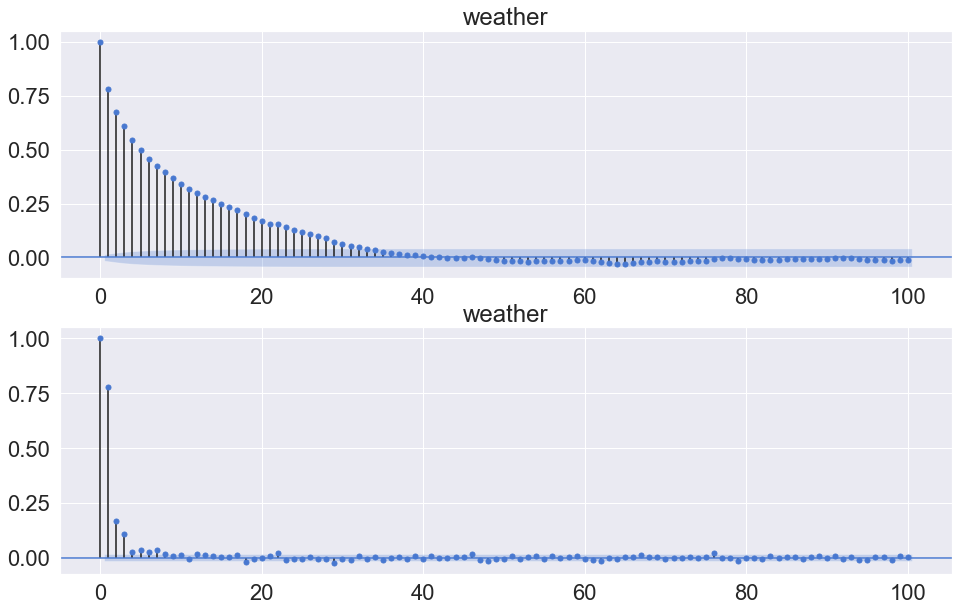

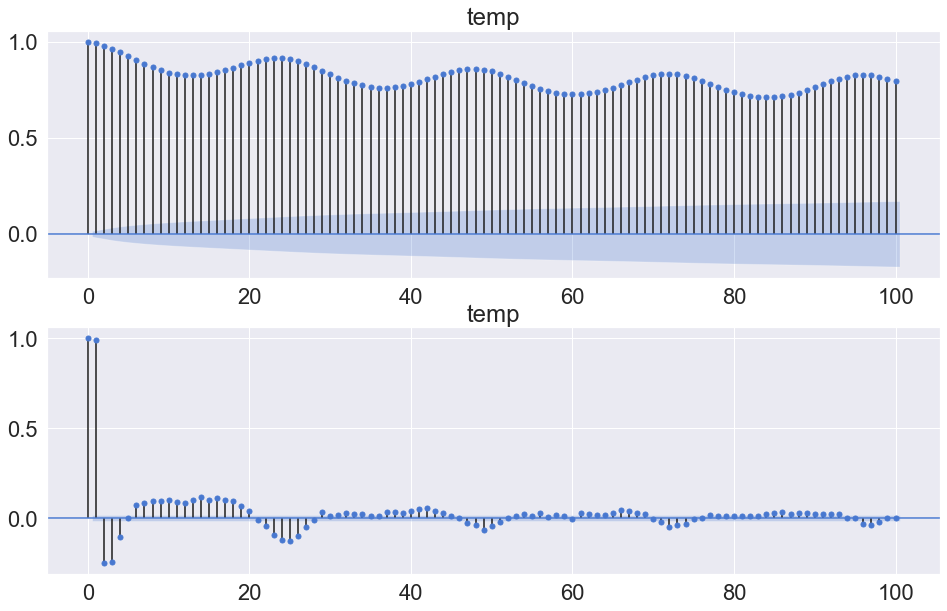

...

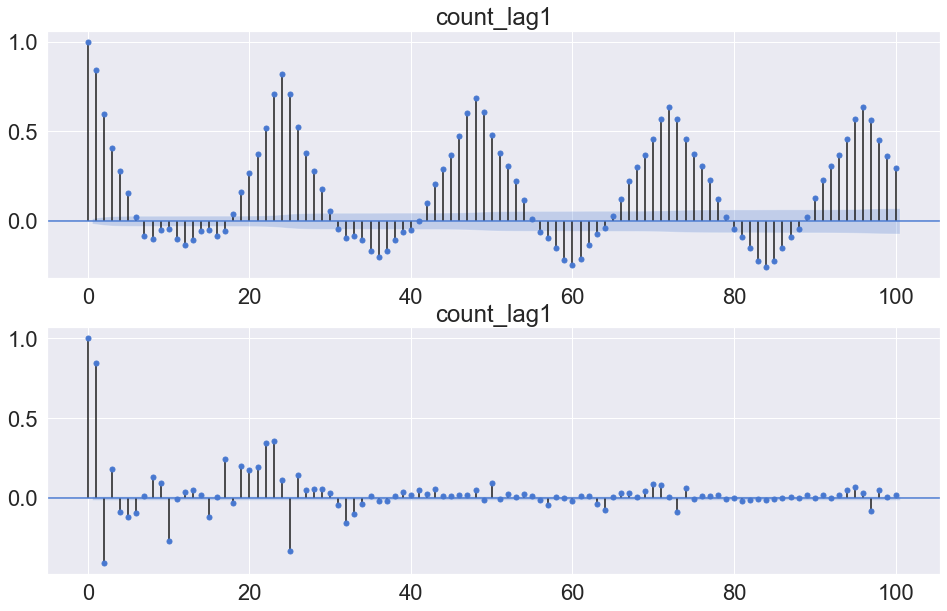

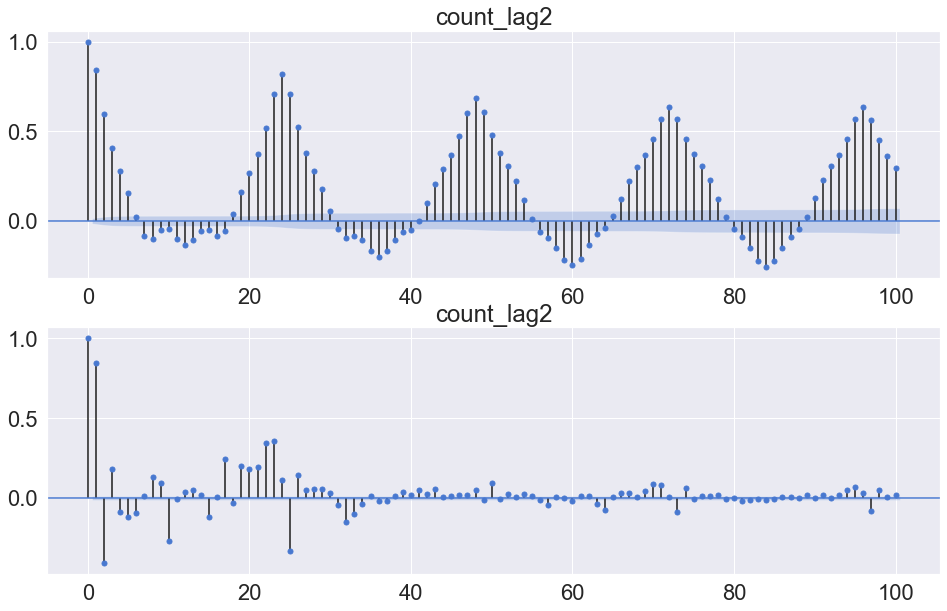

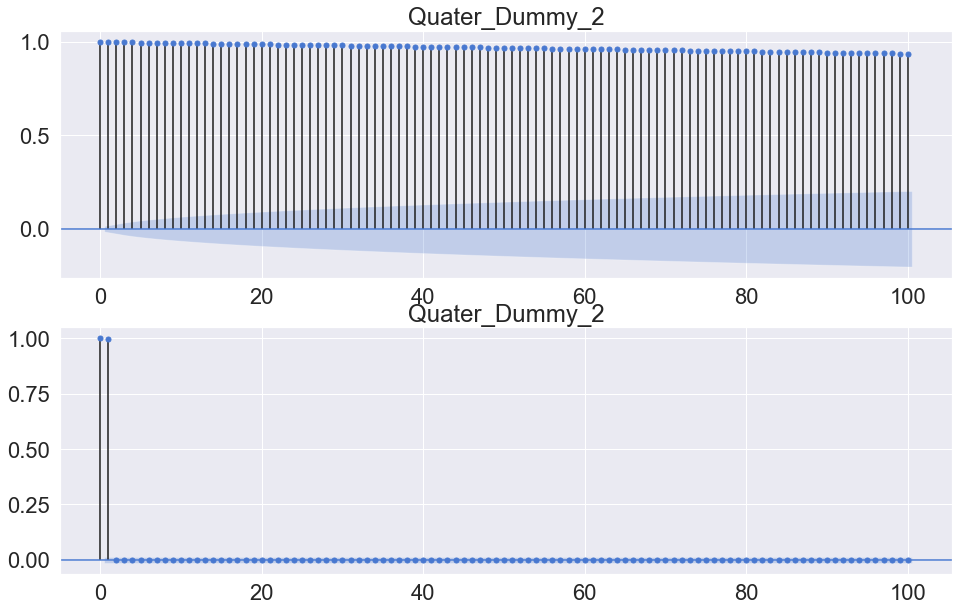

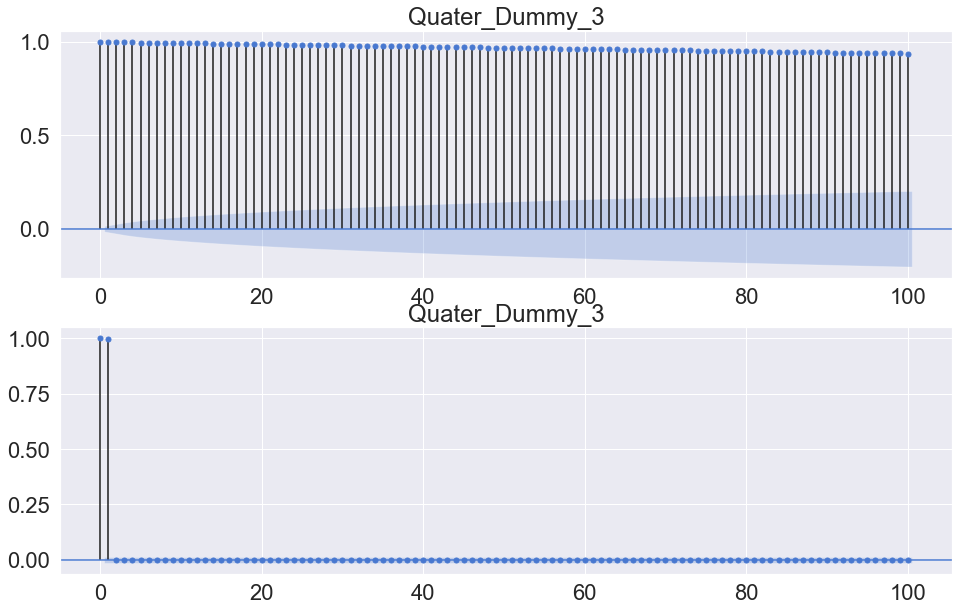

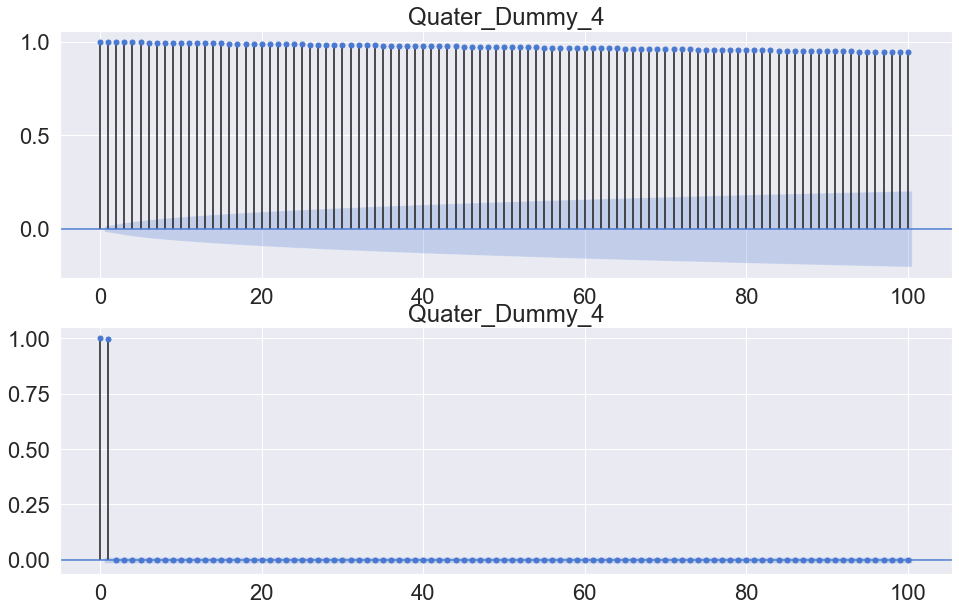

In [39]:
for col in raw_feR.describe().columns:
    target = raw_feR[col]
    figure, axes = plt.subplots(2,1,figsize=(16,10))
    sm.graphics.tsa.plot_acf(target, lags=100, use_vlines=True, ax=axes[0], title=col)
    sm.graphics.tsa.plot_pacf(target, lags=100, use_vlines=True, ax=axes[1], title=col)  
#     figure, axes = plt.subplots(1,1,figsize=(16,5))
# #     sm.graphics.tsa.plot_acf(target, lags=100, use_vlines=True, ax=axes, title=col)
#     sm.graphics.tsa.plot_pacf(target, lags=100, use_vlines=True, ax=axes, title=col)
# count_trend, count_seasonal, count_Day, count_Week, count_diff, Hour, DayofWeek, count_lag1, count_lag2

In [74]:
# X축 끼리의 corrleation을 보는 것. 

raw_feR.corr().loc[X_colname, X_colname].style.background_gradient().set_precision(2).set_properties(**{'font-size': '11pt'})

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,count_trend,count_seasonal,count_Day,count_Week,count_diff,Year,Quater_ver2,Month,Day,Hour,DayofWeek,count_lag1,count_lag2,Quater_Dummy_2,Quater_Dummy_3,Quater_Dummy_4
season,1.00,-0.02,0.02,-0.02,0.32,0.33,0.15,-0.14,0.55,0.00,0.55,0.63,0.00,-0.00,0.42,0.83,-0.00,-0.01,-0.01,0.18,0.18,-0.20,0.31,0.60
holiday,-0.02,1.00,-0.26,-0.00,-0.04,-0.04,-0.01,0.01,-0.07,-0.00,-0.06,-0.02,-0.00,0.00,0.01,0.01,-0.01,0.01,-0.19,-0.04,-0.04,-0.03,-0.03,0.05
workingday,0.02,-0.26,1.00,0.04,0.05,0.05,0.02,-0.02,0.02,0.00,0.03,0.01,0.00,0.00,-0.00,-0.00,0.01,-0.00,-0.70,0.03,0.02,0.01,0.01,-0.02
weather,-0.02,-0.00,0.04,1.00,-0.11,-0.11,0.43,0.05,-0.18,-0.00,-0.12,-0.06,-0.01,-0.02,-0.02,0.00,0.01,-0.02,-0.06,-0.14,-0.14,-0.03,-0.07,0.05
temp,0.32,-0.04,0.05,-0.11,1.00,0.99,-0.07,-0.02,0.70,0.17,0.71,0.77,0.00,0.05,0.14,0.21,0.02,0.14,-0.03,0.41,0.40,0.26,0.60,-0.31
atemp,0.33,-0.04,0.05,-0.11,0.99,1.00,-0.06,-0.06,0.70,0.16,0.71,0.76,-0.00,0.05,0.15,0.22,0.02,0.13,-0.03,0.41,0.40,0.27,0.58,-0.29
humidity,0.15,-0.01,0.02,0.43,-0.07,-0.06,1.00,-0.27,0.01,-0.34,0.04,0.13,-0.01,-0.08,0.00,0.16,0.03,-0.27,-0.04,-0.33,-0.31,-0.03,0.06,0.10
windspeed,-0.14,0.01,-0.02,0.05,-0.02,-0.06,-0.27,1.00,-0.16,0.19,-0.16,-0.13,0.02,-0.01,-0.07,-0.13,0.02,0.14,-0.00,0.08,0.06,0.04,-0.10,-0.06
count_trend,0.55,-0.07,0.02,-0.18,0.70,0.70,0.01,-0.16,1.00,0.00,0.93,0.86,0.00,-0.00,0.22,0.45,-0.01,-0.00,-0.00,0.30,0.30,0.30,0.43,0.00
count_seasonal,0.00,-0.00,0.00,-0.00,0.17,0.16,-0.34,0.19,0.00,1.00,0.00,0.00,0.20,-0.00,-0.00,0.00,-0.00,0.55,0.00,0.60,0.41,0.00,0.00,0.00


In [75]:
# correlation from features
raw_feR.corr().loc[X_colname, X_colname].style.background_gradient().set_precision(2).set_properties(**{'font-size': '11pt'})

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,count_trend,count_seasonal,count_Day,count_Week,count_diff,Year,Quater_ver2,Month,Day,Hour,DayofWeek,count_lag1,count_lag2,Quater_Dummy_2,Quater_Dummy_3,Quater_Dummy_4
season,1.00,-0.02,0.02,-0.02,0.32,0.33,0.15,-0.14,0.55,0.00,0.55,0.63,0.00,-0.00,0.42,0.83,-0.00,-0.01,-0.01,0.18,0.18,-0.20,0.31,0.60
holiday,-0.02,1.00,-0.26,-0.00,-0.04,-0.04,-0.01,0.01,-0.07,-0.00,-0.06,-0.02,-0.00,0.00,0.01,0.01,-0.01,0.01,-0.19,-0.04,-0.04,-0.03,-0.03,0.05
workingday,0.02,-0.26,1.00,0.04,0.05,0.05,0.02,-0.02,0.02,0.00,0.03,0.01,0.00,0.00,-0.00,-0.00,0.01,-0.00,-0.70,0.03,0.02,0.01,0.01,-0.02
weather,-0.02,-0.00,0.04,1.00,-0.11,-0.11,0.43,0.05,-0.18,-0.00,-0.12,-0.06,-0.01,-0.02,-0.02,0.00,0.01,-0.02,-0.06,-0.14,-0.14,-0.03,-0.07,0.05
temp,0.32,-0.04,0.05,-0.11,1.00,0.99,-0.07,-0.02,0.70,0.17,0.71,0.77,0.00,0.05,0.14,0.21,0.02,0.14,-0.03,0.41,0.40,0.26,0.60,-0.31
atemp,0.33,-0.04,0.05,-0.11,0.99,1.00,-0.06,-0.06,0.70,0.16,0.71,0.76,-0.00,0.05,0.15,0.22,0.02,0.13,-0.03,0.41,0.40,0.27,0.58,-0.29
humidity,0.15,-0.01,0.02,0.43,-0.07,-0.06,1.00,-0.27,0.01,-0.34,0.04,0.13,-0.01,-0.08,0.00,0.16,0.03,-0.27,-0.04,-0.33,-0.31,-0.03,0.06,0.10
windspeed,-0.14,0.01,-0.02,0.05,-0.02,-0.06,-0.27,1.00,-0.16,0.19,-0.16,-0.13,0.02,-0.01,-0.07,-0.13,0.02,0.14,-0.00,0.08,0.06,0.04,-0.10,-0.06
count_trend,0.55,-0.07,0.02,-0.18,0.70,0.70,0.01,-0.16,1.00,0.00,0.93,0.86,0.00,-0.00,0.22,0.45,-0.01,-0.00,-0.00,0.30,0.30,0.30,0.43,0.00
count_seasonal,0.00,-0.00,0.00,-0.00,0.17,0.16,-0.34,0.19,0.00,1.00,0.00,0.00,0.20,-0.00,-0.00,0.00,-0.00,0.55,0.00,0.60,0.41,0.00,0.00,0.00


색 진한애들이 다중공선성 높을 가능성 높은 애들을 알 수 있음. <br>
70% 짜리도 많이 나옴. 이렇게 우리 데이터들은 현실적으로 corrleation이 높게 나오는 경우가 많다. 

Autocorrelation도 확인할 수 있다.

In [77]:
raw_feR.describe()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,count_trend,count_seasonal,count_Day,count_Week,count_diff,Year,Quater_ver2,Month,Day,Hour,DayofWeek,count_lag1,count_lag2,Quater_Dummy_2,Quater_Dummy_3,Quater_Dummy_4
count,"17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00","17,544.00"
mean,2.50,0.03,0.68,1.43,20.30,23.71,62.87,12.81,35.35,152.44,187.80,141.91,-0.16,141.82,141.60,-0.04,"2,011.50",4.51,6.52,15.74,11.51,3.00,187.79,187.79,0.25,0.25,0.25
std,1.11,0.17,0.47,0.65,7.92,8.62,19.34,8.29,49.19,151.28,181.35,56.89,128.49,57.02,51.15,75.16,0.50,2.29,3.45,8.80,6.94,2.01,181.35,181.35,0.43,0.43,0.43
min,1.00,0.00,0.00,1.00,0.82,0.00,0.00,0.00,0.00,0.00,1.00,20.00,-181.67,19.96,45.95,-357.00,"2,011.00",1.00,1.00,1.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00
25%,2.00,0.00,0.00,1.00,13.94,16.66,48.00,7.00,4.00,32.00,38.00,88.45,-125.09,88.33,94.80,-32.00,"2,011.00",3.00,4.00,8.00,5.00,1.00,38.00,38.00,0.00,0.00,0.00
50%,3.00,0.00,1.00,1.00,20.50,24.24,63.00,13.00,16.00,114.00,140.00,155.10,19.32,155.19,159.72,-3.00,"2,012.00",5.00,7.00,16.00,12.00,3.00,140.00,140.00,0.00,0.00,0.00
75%,3.00,0.00,1.00,2.00,27.06,31.06,79.00,17.00,48.00,219.00,279.00,190.04,64.52,190.12,185.03,23.00,"2,012.00",7.00,10.00,23.00,17.25,5.00,279.00,279.00,0.00,1.00,1.00
max,4.00,1.00,1.00,4.00,41.00,50.00,100.00,57.00,367.00,886.00,977.00,269.65,273.37,269.88,217.98,417.00,"2,012.00",8.00,12.00,31.00,23.00,6.00,977.00,977.00,1.00,1.00,1.00


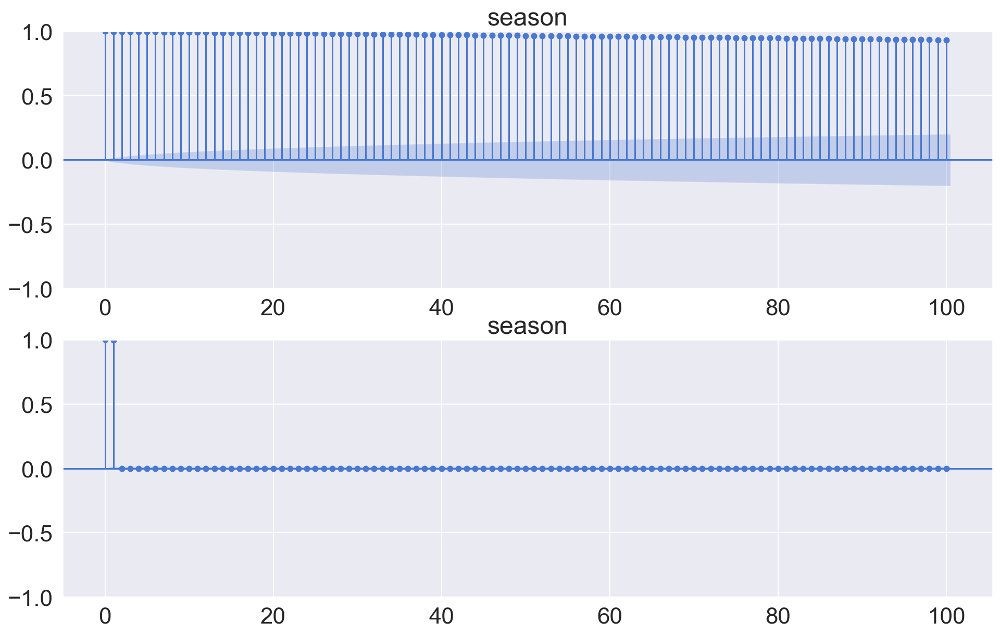

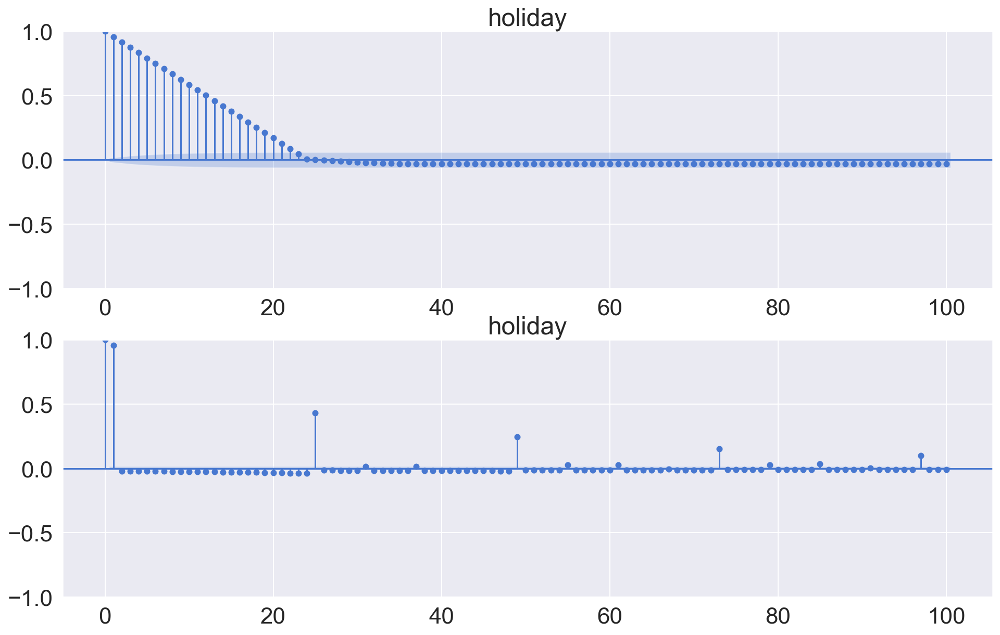

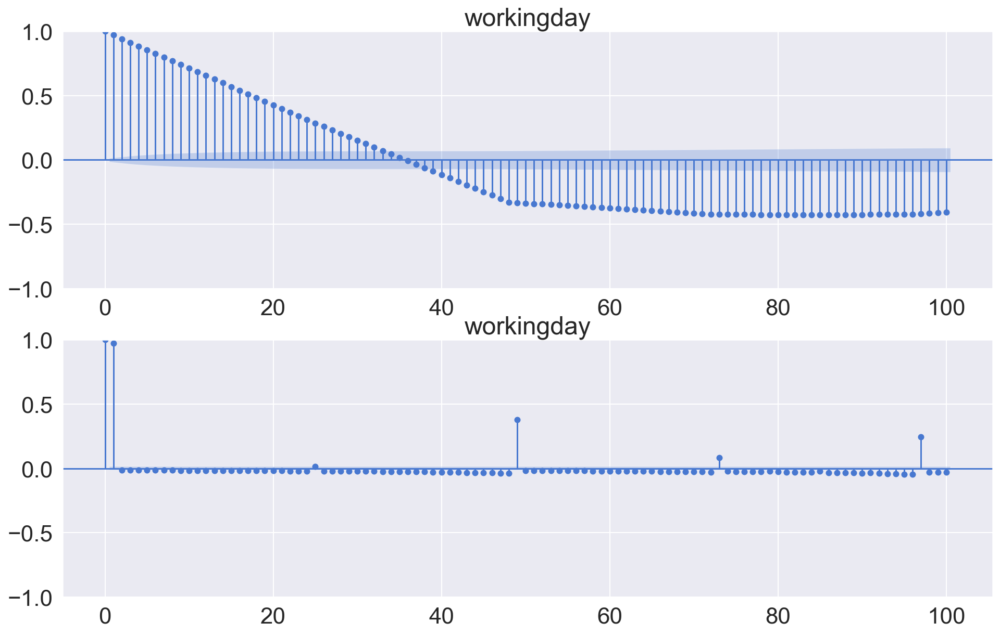

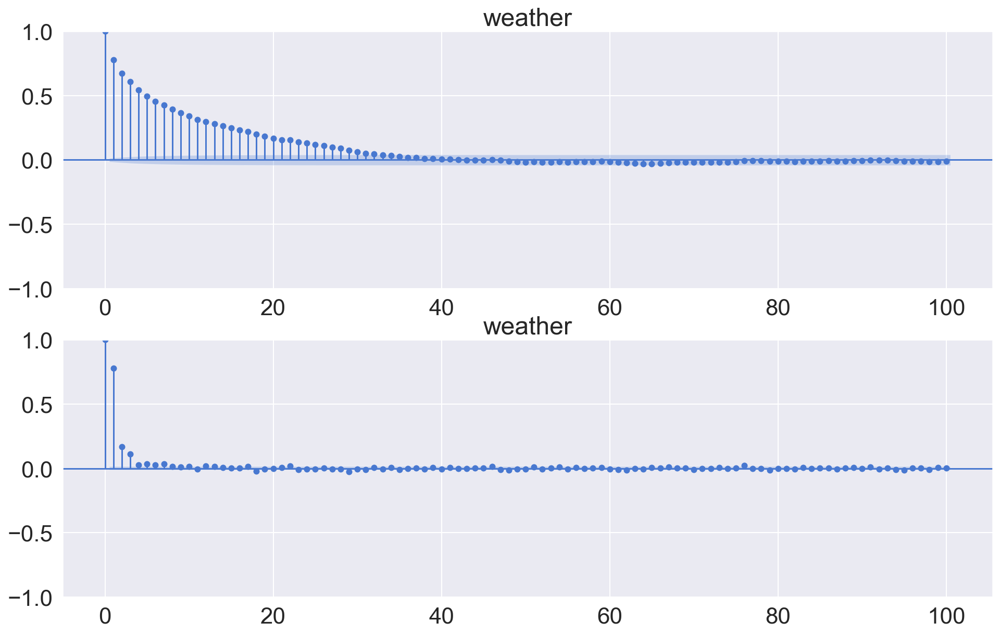

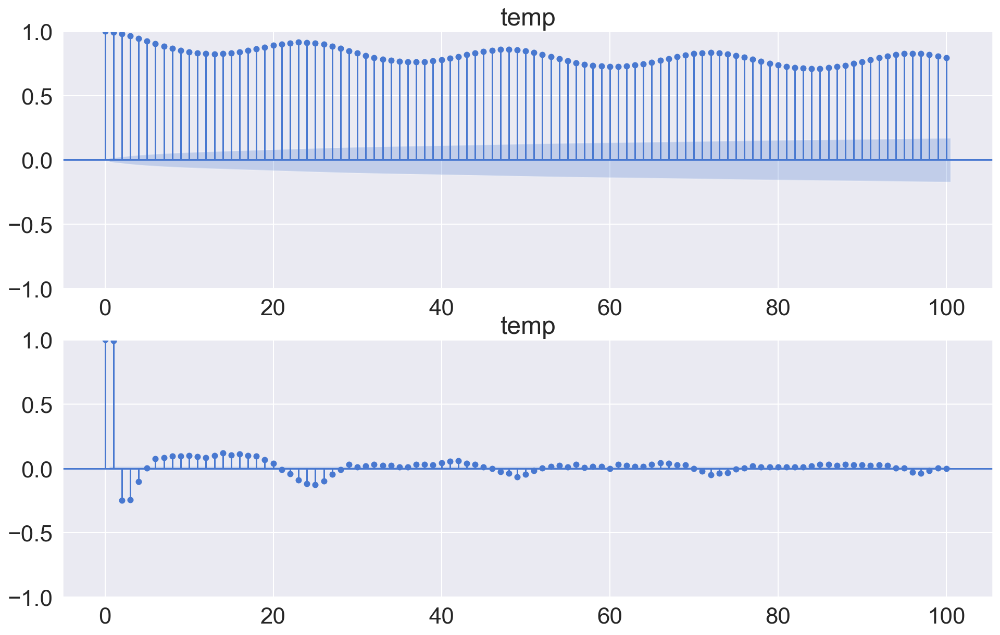

...

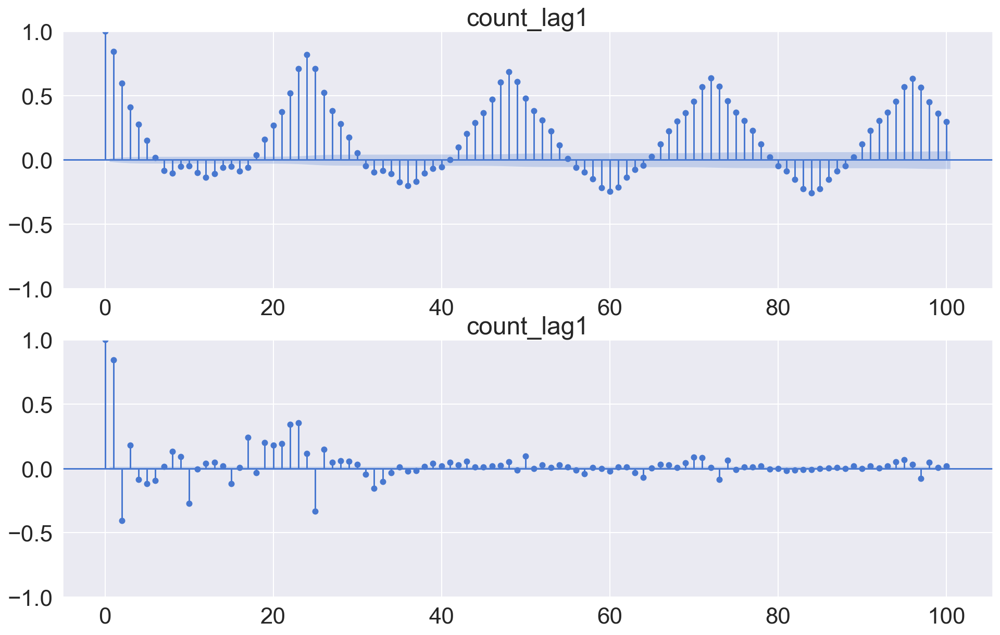

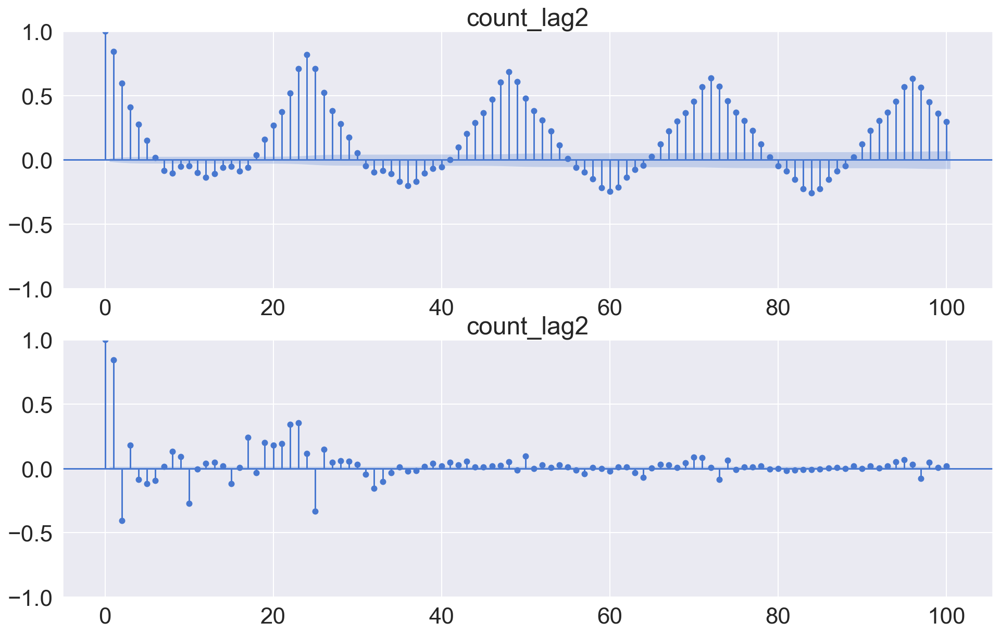

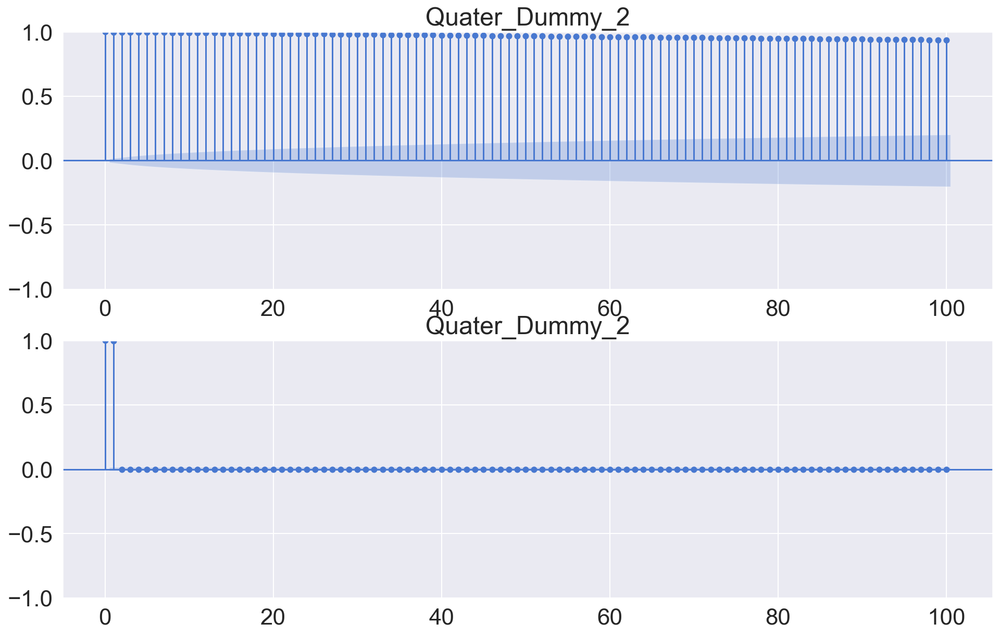

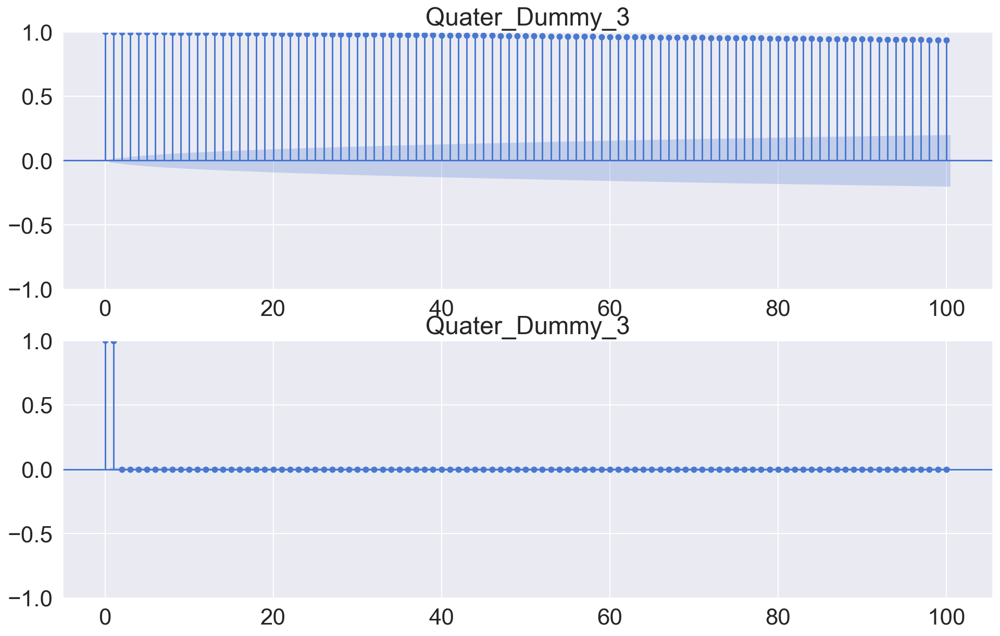

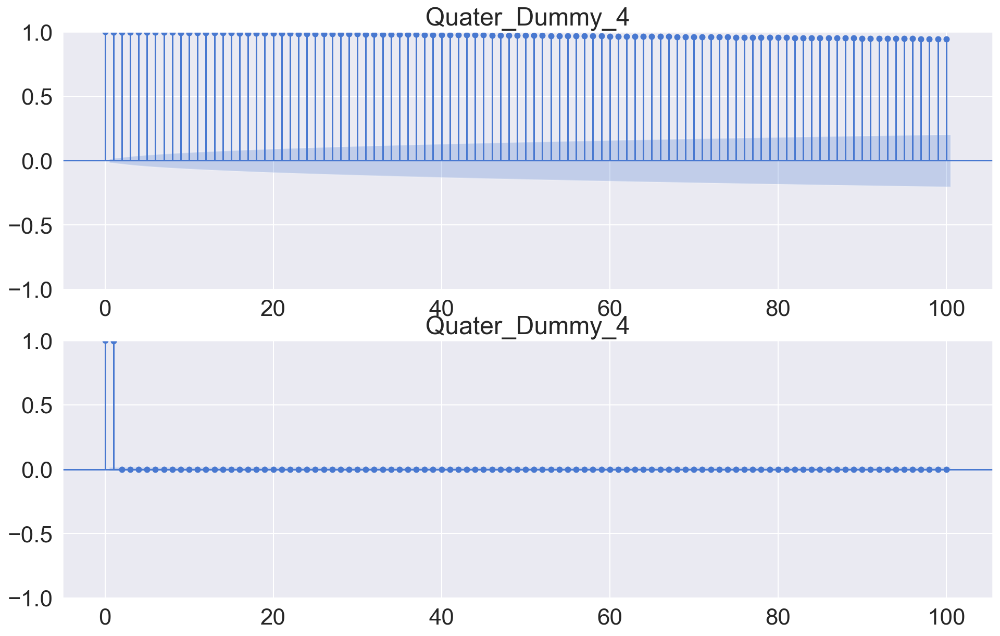

In [76]:
# describe.columns한 이유는 숫자로 된 것들만 describe가 나오니깐, 숫자로 된 값만 고른 것. 

for col in raw_feR.describe().columns:
    target = raw_feR[col]
    figure, axes = plt.subplots(2,1,figsize=(16,10))
    sm.graphics.tsa.plot_acf(target, lags=100, use_vlines=True, ax=axes[0], title=col)
    sm.graphics.tsa.plot_pacf(target, lags=100, use_vlines=True, ax=axes[1], title=col)  
#     figure, axes = plt.subplots(1,1,figsize=(16,5))
# #     sm.graphics.tsa.plot_acf(target, lags=100, use_vlines=True, ax=axes, title=col)
#     sm.graphics.tsa.plot_pacf(target, lags=100, use_vlines=True, ax=axes, title=col)
# count_trend, count_seasonal, count_Day, count_Week, count_diff, Hour, DayofWeek, count_lag1, count_lag2

VIF

In [81]:
# 아래처럼 실행하면, 
# X_0 = a*X_1 + b*X_2 ...
# 이런식으로 X_0을 나머지 값들로 회귀분석 하고 나온 R^2추정해서 VIF계산한 것. 
# 이 숫자가 높을 수록 종속성이 높은 것. 안 좋은 것. 

variance_inflation_factor(X_train_feRS.values, 0)

29.52178292513622

In [83]:
# extract effective features using variance inflation factor


vif = pd.DataFrame()

# 독립변수 X의 갯수 만큼 for loop돌리는 것. 
vif['VIF_Factor'] = [variance_inflation_factor(X_train_feRS.values, i) 
                     for i in range(X_train_feRS.shape[1])]
vif['Feature'] = X_train_feRS.columns
vif.sort_values(by='VIF_Factor', ascending=True)

,VIF_Factor,Feature
12,1.56,count_diff
1,1.61,holiday
9,2.89,count_seasonal
16,4.32,Day
7,4.51,windspeed
14,6.69,Quater_ver2
17,6.87,Hour
3,8.38,weather
21,8.83,Quater_Dummy_2
18,9.03,DayofWeek


In [43]:
# extract effective features using variance inflation factor
vif = pd.DataFrame()
vif['VIF_Factor'] = [variance_inflation_factor(X_train_feRS.values, i) 
                     for i in range(X_train_feRS.shape[1])]
vif['Feature'] = X_train_feRS.columns

# 현재 상위 10개 뽑아본 것. 
vif.sort_values(by='VIF_Factor', ascending=True)['Feature'][:10].values

array(['count_diff', 'holiday', 'count_seasonal', 'Day', 'windspeed',
       'Quater_ver2', 'Hour', 'weather', 'Quater_Dummy_2', 'DayofWeek'],
      dtype=object)

corrleation으로 구했던 것과 비교해보자. <br>
`count_trend, count_seasonal, count_Day, count_Week, count_diff, Hour, DayofWeek, count_lag1, count_lag2` 얘들은 Y<->X의 cor을 줬던 것. <br>

잘 보니깐, 위에 두 표가 나타내는 것이 거의 비슷하다. **어느정도 일치하다.** 

### Code Summary (Multicollinearity)

In [90]:
### Functionalize
### extract non-multicollinearity variables by VIF 
def feature_engineering_XbyVIF(X_train, num_variables):
    vif = pd.DataFrame()
    vif['VIF_Factor'] = [variance_inflation_factor(X_train.values, i) 
                         for i in range(X_train.shape[1])]
    vif['Feature'] = X_train.columns
    X_colname_vif = vif.sort_values(by='VIF_Factor', ascending=True)['Feature'][:num_variables].values
    return X_colname_vif
X_colname_vif = feature_engineering_XbyVIF(X_train_feRS, 3)
X_colname_vif

array(['count_diff', 'holiday', 'count_seasonal'], dtype=object)

Train_size: (13128, 29) Test_size: (4416, 29)
X_train: (13128, 24) Y_train: (13128, 1)
X_test: (4416, 24) Y_test: (4416, 1)


100%|███████████████████████████████████████████| 24/24 [00:10<00:00,  2.25it/s]


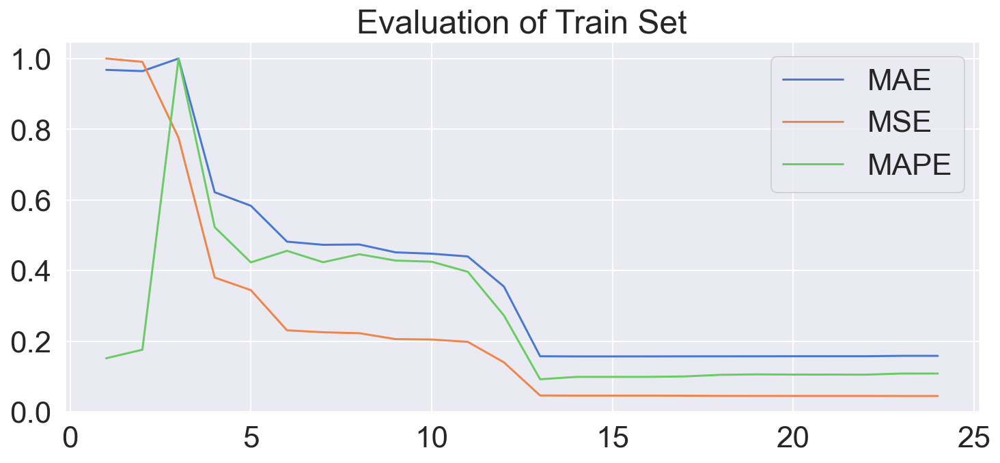

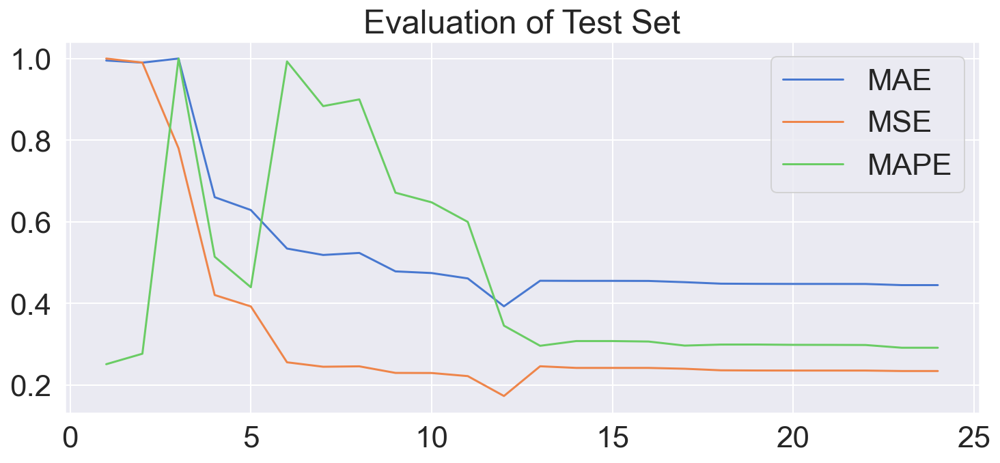

In [86]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './lecture_source/OnlineTSA-master/Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_fe = feature_engineering(raw_all)
### Reality ###
target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
raw_feR = feature_engineering_year_duplicated(raw_fe, target)
###############

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train_feR, X_test_feR, Y_train_feR, Y_test_feR = datasplit_ts(raw_feR, Y_colname, X_colname, '2012-07-01')
### Reality ###
target = ['count_lag1', 'count_lag2']
X_test_feR = feature_engineering_lag_modified(Y_test_feR, X_test_feR, target)
###############
### Scaling ###
X_train_feRS, X_test_feRS = feature_engineering_scaling(preprocessing.Normalizer(), X_train_feR, X_test_feR)
###############

eval_tr = pd.DataFrame()
eval_te = pd.DataFrame()

# 1개부터 feature수 까지 하나씩 vif를 뽑아보면서 볼려는 것. 
# 몇개를 써야하는지 기준이 없으니깐, 하나씩 보려는 것. 
for i in tqdm(range(1,len(X_train_feRS.columns)+1)):
    X_colname_vif = feature_engineering_XbyVIF(X_train_feRS, i)
#     print('Number_of_Selected_X: ', len(X_colname_vif))
    X_train_feRSM, X_test_feRSM = X_train_feRS[X_colname_vif].copy(), X_test_feRS[X_colname_vif].copy()
    
    # Applying Base Model
    fit_reg1_feRSM = sm.OLS(Y_train_feR, X_train_feRSM).fit()
    pred_tr_reg1_feRSM = fit_reg1_feRSM.predict(X_train_feRSM).values
    pred_te_reg1_feRSM = fit_reg1_feRSM.predict(X_test_feRSM).values

    # Evaluation
    Score_reg1_feRSM, Resid_tr_reg1_feRSM, Resid_te_reg1_feRSM = evaluation_trte(Y_train_feR, pred_tr_reg1_feRSM,
                                                                       Y_test_feR, pred_te_reg1_feRSM, graph_on=False)
    eval_tr = pd.concat([eval_tr, Score_reg1_feRSM.loc[['Train']]], axis=0)
    eval_te = pd.concat([eval_te, Score_reg1_feRSM.loc[['Test']]], axis=0)
eval_tr.index = range(1,len(X_train_feRS.columns)+1)
eval_te.index = range(1,len(X_train_feRS.columns)+1)

plt.figure(figsize=(12,5))

# 최대가 1이 나오도록 scaling
plt.plot(eval_tr.index, eval_tr/eval_tr.max())
plt.legend(eval_tr.columns)
plt.title('Evaluation of Train Set')
plt.show()

plt.figure(figsize=(12,5))
plt.plot(eval_te.index, eval_te/eval_te.max())
plt.legend(eval_te.columns)
plt.title('Evaluation of Test Set')
plt.show()

현재 1은 max만 쓴 것. 어쨋든 증가될수록 error가 줄어드네. <br>
근데 13개 이후로는 뭐 딱히 줄어들지도 않고, 심지어 늘어나는 지표도 있다. <br>
즉, 24개를 쓸 필요가 없다는 거야. 13개만 써도 성능이 동일한 것. <br>
11개는 Multicolinearity가 있다는 것. <br>

Eval은 12개를 쓸 때가 제일 좋다. 

In [88]:
Score_reg1_feRSM

,MAE,MSE,MAPE
Train,27.18,"2,324.78",80.36
Test,113.06,"25,908.84",129.35


그럼 12개만 사용해서 다시 회귀분석 해보자. <br>
지표가 다들 엄청 좋아졌다. <br>
condition number, 계수들 유의성, Kurtosis 등 대부분 다 지표가 좋아짐. 

Train_size: (13128, 29) Test_size: (4416, 29)
X_train: (13128, 24) Y_train: (13128, 1)
X_test: (4416, 24) Y_test: (4416, 1)
Number_of_Total_X:  24
Number_of_Selected_X:  12


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  count   R-squared (uncentered):                   0.864
Model:                            OLS   Adj. R-squared (uncentered):              0.864
Method:                 Least Squares   F-statistic:                              6925.
Date:                Mon, 22 Nov 2021   Prob (F-statistic):                        0.00
Time:                        00:21:40   Log-Likelihood:                         -77008.
No. Observations:               13128   AIC:                                  1.540e+05
Df Residuals:                   13116   BIC:                                  1.541e+05
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
count_diff      1289.2806     25.881     49.816      0.000    1238.550    1340.011
holiday         7.141e+04   1.01e+04      7.044      0.000    5.15e+04    9.13e+04
count_seasonal  1270.9307     16.107     78.906      0.000    1239.359    1302.503
Day             1151.2606    168.230      6.843      0.000     821.505    1481.017
windspeed       -234.1084    180.733     -1.295      0.195    -588.370     120.154
Quater_ver2     2.865e+04    930.475     30.787      0.000    2.68e+04    3.05e+04
Hour           -3514.0425    282.316    -12.447      0.000   -4067.422   -2960.663
weather        -2.423e+04   2238.550    -10.825      0.000   -2.86e+04   -1.98e+04
Quater_Dummy_2  6.725e+04   3436.993     19.566      0.000    6.05e+04     7.4e+04
DayofWeek       1.621e+04    912.387     17.768      0.000    1.44e+04     1.8e+04
workingday      7.695e+04   4056.717     18.970      0.000     6.9e+04    8.49e+04
count_lag2      1061.0008     14.379     73.788      0.000    1032.816    1089.186
==============================================================================
Omnibus:                     1665.324   Durbin-Watson:                   0.829
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5853.426
Skew:                           0.626   Prob(JB):                         0.00
Kurtosis:                       6.022   Cond. No.                     1.53e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 1.53e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

,MAE,MSE,MAPE
Train,60.84,"7,288.40",202.42
Test,99.87,"19,151.40",153.34


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

,Stationarity_adf,Stationarity_kpss,Normality,Autocorr(lag1),Autocorr(lag5),Autocorr(lag10),Autocorr(lag50),Heteroscedasticity
Test Statistics,-10.30,1.32,0.95,"4,492.76","4,708.56","7,076.59","16,328.78",2.71
p-value,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00
Used Lag,41.00,89.00,NaN,NaN,NaN,NaN,NaN,NaN
Used Observations,"13,086.00",NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(1%),-3.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Maximum Information Criteria,"140,733.05",NaN,NaN,NaN,NaN,NaN,NaN,NaN
Critical Value(10%),NaN,0.35,NaN,NaN,NaN,NaN,NaN,NaN
Alternative,NaN,NaN,NaN,NaN,NaN,NaN,NaN,two-sided


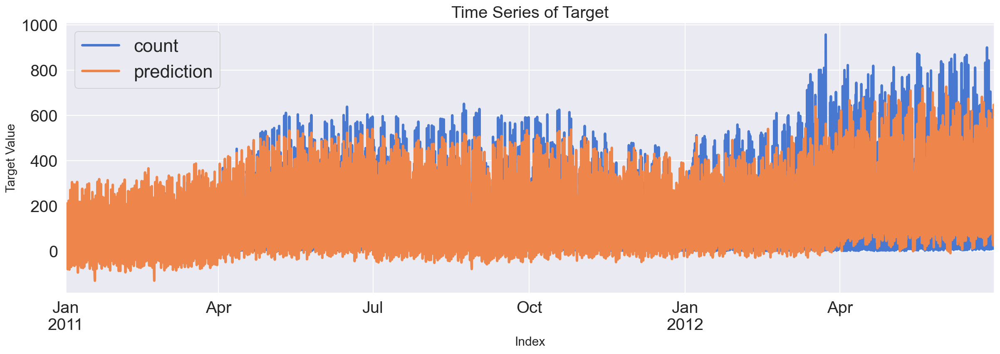

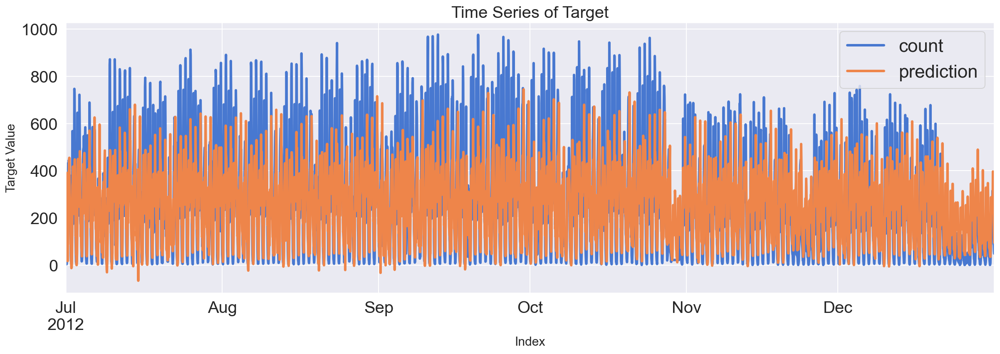

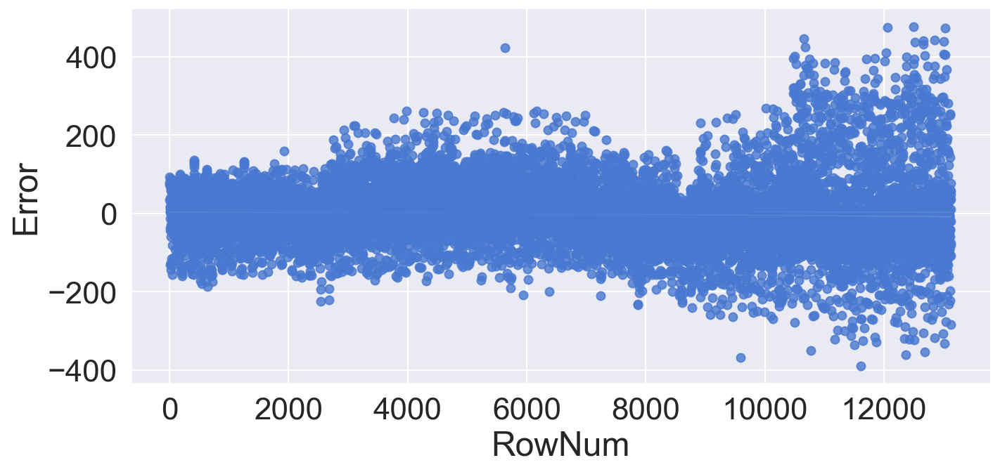

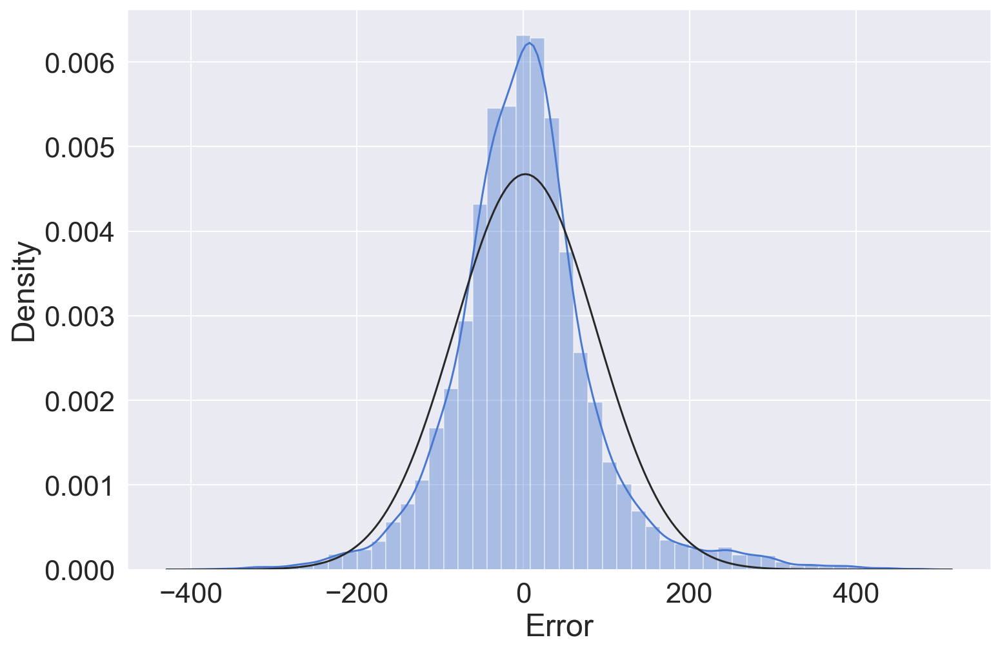

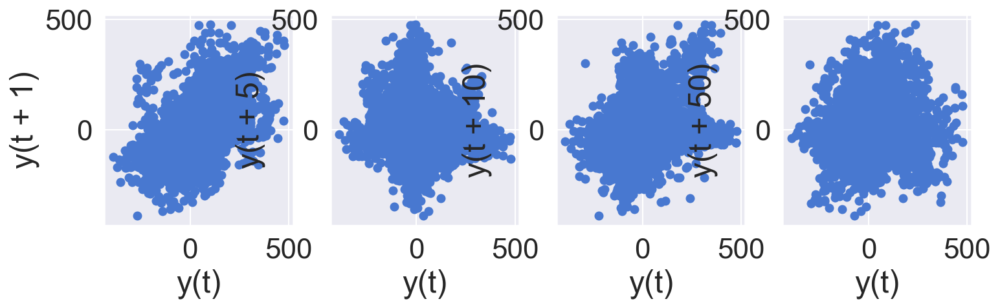

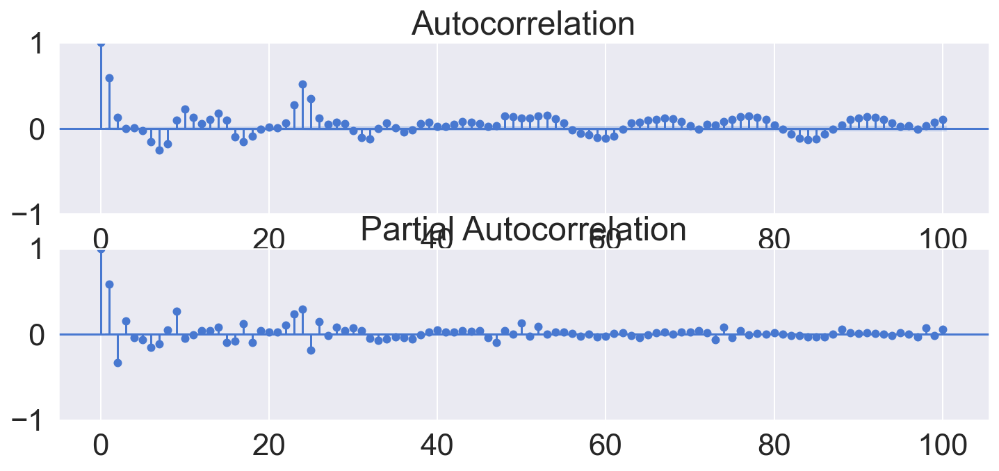

In [91]:
# Data Loading
# location = 'https://raw.githubusercontent.com/cheonbi/DataScience/master/Data/Bike_Sharing_Demand_Full.csv'
location = './lecture_source/OnlineTSA-master/Data/BikeSharingDemand/Bike_Sharing_Demand_Full.csv'
raw_all = pd.read_csv(location)

# Feature Engineering
raw_fe = feature_engineering(raw_all)
### Reality ###
target = ['count_trend', 'count_seasonal', 'count_Day', 'count_Week', 'count_diff']
raw_feR = feature_engineering_year_duplicated(raw_fe, target)
###############

# Data Split
# Confirm of input and output
Y_colname = ['count']
X_remove = ['datetime', 'DateTime', 'temp_group', 'casual', 'registered']
X_colname = [x for x in raw_fe.columns if x not in Y_colname+X_remove]
X_train_feR, X_test_feR, Y_train_feR, Y_test_feR = datasplit_ts(raw_feR, Y_colname, X_colname, '2012-07-01')
### Reality ###
target = ['count_lag1', 'count_lag2']
X_test_feR = feature_engineering_lag_modified(Y_test_feR, X_test_feR, target)
###############
### Scaling ###
X_train_feRS, X_test_feRS = feature_engineering_scaling(preprocessing.Normalizer(), X_train_feR, X_test_feR)
###############

# 딱 아래 4개만 쓴 것. 
# 12개만 VIF함수에서 받아서 실행시킨 것. 
### Multicollinearity ###
print('Number_of_Total_X: ', len(X_train_feRS.columns))
X_colname_vif = feature_engineering_XbyVIF(X_train_feRS, 12)
print('Number_of_Selected_X: ', len(X_colname_vif))
X_train_feRSM, X_test_feRSM = X_train_feRS[X_colname_vif].copy(), X_test_feRS[X_colname_vif].copy()
#########################

# Applying Base Model
fit_reg1_feRSM = sm.OLS(Y_train_feR, X_train_feRSM).fit()
display(fit_reg1_feRSM.summary())
pred_tr_reg1_feRSM = fit_reg1_feRSM.predict(X_train_feRSM).values
pred_te_reg1_feRSM = fit_reg1_feRSM.predict(X_test_feRSM).values

# Evaluation
Score_reg1_feRSM, Resid_tr_reg1_feRSM, Resid_te_reg1_feRSM = evaluation_trte(Y_train_feR, pred_tr_reg1_feRSM,
                                                                   Y_test_feR, pred_te_reg1_feRSM, graph_on=True)
display(Score_reg1_feRSM)

# Error Analysis
error_analysis(Resid_tr_reg1_feRSM, ['Error'], X_train_feRSM, graph_on=True)

# Final Result Comparison: 전처리(Raw/Reality/Scaling/Multicollinearity) 별 결과비교

In [92]:
# comparison of precision
display(Score_reg1_rd)
display(Score_reg1_feR)
display(Score_reg1_feRS)
display(Score_reg1_feRSM)

,MAE,MSE,MAPE
Train,103.09,"19,360.42",458.48
Test,150.03,"43,410.27",316.61


,MAE,MSE,MAPE
Train,27.79,"2,364.05",82.11
Test,113.99,"26,316.17",133.61


,MAE,MSE,MAPE
Train,27.18,"2,324.78",80.36
Test,113.06,"25,908.84",129.35


,MAE,MSE,MAPE
Train,60.84,"7,288.40",202.42
Test,99.87,"19,151.40",153.34


In [93]:
# comparison of metrics
comparison_r2 = pd.DataFrame([fit_reg1_rd.rsquared_adj, fit_reg1_feR.rsquared_adj, 
                              fit_reg1_feRS.rsquared_adj, fit_reg1_feRSM.rsquared_adj], 
                             index=['rd', 'feR', 'feRS', 'feRSM'], columns=['R^2_adj']).T
comparison_fvalue = pd.DataFrame([fit_reg1_rd.fvalue, fit_reg1_feR.fvalue, 
                                  fit_reg1_feRS.fvalue, fit_reg1_feRSM.fvalue], 
                                 index=['rd', 'feR', 'feRS', 'feRSM'], columns=['F-statistics']).T
comparison_fpvalue = pd.DataFrame([fit_reg1_rd.f_pvalue, fit_reg1_feR.f_pvalue, 
                                   fit_reg1_feRS.f_pvalue, fit_reg1_feRSM.f_pvalue], 
                                  index=['rd', 'feR', 'feRS', 'feRSM'], columns=['prob(F-stat.)']).T
comparison_aic = pd.DataFrame([fit_reg1_rd.aic, fit_reg1_feR.aic, 
                              fit_reg1_feRS.aic, fit_reg1_feRSM.aic], 
                             index=['rd', 'feR', 'feRS', 'feRSM'], columns=['aic']).T
comparison_bic = pd.DataFrame([fit_reg1_rd.bic, fit_reg1_feR.bic, 
                               fit_reg1_feRS.bic, fit_reg1_feRSM.bic], 
                              index=['rd', 'feR', 'feRS', 'feRSM'], columns=['bic']).T
pd.concat([comparison_r2, comparison_fvalue, comparison_fpvalue, comparison_aic, comparison_bic], axis=0)

,rd,feR,feRS,feRSM
R^2_adj,0.64,0.91,0.96,0.86
F-statistics,"2,889.02","5,657.99","12,011.02","6,924.95"
prob(F-stat.),0.00,0.00,0.00,0.00
aic,"166,857.95","139,283.69","139,063.76","154,040.60"
bic,"166,917.81","139,463.27","139,243.34","154,130.39"


이게 고민해봐야할 point. <br>
나는 어떤 coef를 쓸 것인가? <br>

In [94]:
# comparison of coefficients
comparison_fit_rd = pd.concat([pd.DataFrame(fit_reg1_rd.params, columns=['coef']), 
                               pd.DataFrame(fit_reg1_rd.pvalues, columns=['prob(coef)'])], axis=1)
comparison_fit_feR = pd.concat([pd.DataFrame(fit_reg1_feR.params, columns=['coef']), 
                               pd.DataFrame(fit_reg1_feR.pvalues, columns=['prob(coef)'])], axis=1)
comparison_fit_feRS = pd.concat([pd.DataFrame(fit_reg1_feRS.params, columns=['coef']), 
                               pd.DataFrame(fit_reg1_feRS.pvalues, columns=['prob(coef)'])], axis=1)
comparison_fit_feRSM = pd.concat([pd.DataFrame(fit_reg1_feRSM.params, columns=['coef']), 
                               pd.DataFrame(fit_reg1_feRSM.pvalues, columns=['prob(coef)'])], axis=1)
pd.concat([comparison_fit_rd, comparison_fit_feR, comparison_fit_feRS, comparison_fit_feRSM], axis=1)

,coef,prob(coef),coef,prob(coef),coef,prob(coef),coef,prob(coef)
season,3.37,0.01,2.75,0.00,"4,315.62",0.03,NaN,NaN
holiday,-6.29,0.40,0.62,0.85,-409.21,0.95,"71,406.59",0.00
workingday,10.36,0.00,2.20,0.15,"2,915.86",0.35,"76,954.13",0.00
weather,7.19,0.00,-5.88,0.00,"-11,054.49",0.00,"-24,231.78",0.00
temp,-7.85,0.00,0.56,0.25,"1,593.80",0.11,NaN,NaN
atemp,16.07,0.00,0.40,0.34,112.30,0.90,NaN,NaN
humidity,-1.74,0.00,-0.07,0.01,-112.49,0.05,NaN,NaN
windspeed,2.27,0.00,-0.12,0.03,-242.00,0.04,-234.11,0.20
count_trend,NaN,NaN,0.07,0.00,119.38,0.01,NaN,NaN
count_seasonal,NaN,NaN,0.19,0.00,356.49,0.00,"1,270.93",0.00


### Y의 정상성 확인

In [106]:
target = Y_train_feR.copy()
stationarity_adf_test(target, 'count')

,Stationarity_adf
Test Statistics,-6.84
p-value,0.00
Used Lag,41.00
Used Observations,"13,086.00"
Critical Value(1%),-3.43
Maximum Information Criteria,"141,050.42"


In [107]:
stationarity_kpss_test(Y_train_feR, 'count')

,Stationarity_kpss
Test Statistics,13.63
p-value,0.01
Used Lag,34.00
Critical Value(10%),0.35


P-value가 둘다 0에 가깝다. <br>
`ADF` : 정상상태이다. <br>
`KPSS` : 비정상 상태이다. <br>

또 왜 이럴까? <br>
통계량도 목적이 조금씩 다르다. ADF는 추세만 없으면 보통 정상이라고 하고, KPSS는 계절성을 조금 더 많이 본다. 경향이 있다는 것. <br>
두개의 케이스가 다르게 나오는 것은 현실적으로 이상하지 않은 것. <br>
현실에서는 모든 가정들이 동일하게 얘기할 때 까지 해봐야 한다. 

엄밀하게는 Y도 정상성을 갖게 하는 게 맞으나, 여기서는 Y는 내비두겠다. 